In [2]:
%matplotlib inline
%load_ext autoreload 
%autoreload 2

import os
import sys
import copy 
from time import time

from astropy.table import Table, vstack

import numpy as np 
import emcee

import scipy.ndimage
from scipy.ndimage.filters import gaussian_filter

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import MaxNLocator

from astroML.stats import binned_statistic_2d

from cap_loess_2d import loess_2d
from cap_plot_velfield import plot_velfield

plt.rcParams['figure.dpi'] = 100.0
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 12.0
plt.rc('text', usetex=True)
    
from asap.asap_data_io import *
from asap.asap_model_setup import *
from asap.asap_utils import *
from asap.asap_run_model import * 
from asap.asap_model_prediction import *
from asap.asap_likelihood import * 
from asap.um_model_plot import *
from asap.full_mass_profile_model import *
from asap.asap_mass_model import * 

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## `frac4` model

### Load config and data

In [3]:
config_file = 'test/asap_smdpl_mmax_m10_frac4_test_6.yaml'

cfg_ini = parse_config(config_file)

cfg, obs_data, um_data = initial_model(cfg_ini, verbose=True)

print(cfg['model_type'])

# Stellar mass catalog: s16a_wide2_massive_fsps1_imgsub_use_short.fits
# Weak lensing profile sample: s16a_wide2_massive_boxbin7_default
# Pre-computed SMF for inner logMs: /Users/song/Dropbox/work/project/hsc_um2/data/s16a_massive_wide2/smf/s16a_wide2_massive_smf_m10_11.6.npy
# Pre-computed SMF for total logMs: /Users/song/Dropbox/work/project/hsc_um2/data/s16a_massive_wide2/smf/s16a_wide2_massive_smf_mmax_11.6.npy
# Covariances for SMFs: None
# Using logm_10 as inner stellar mass.
# Using logm_max as total stellar mass.
# There are 12 weak lensing profiles in this sample
# SMF for total stellar mass: 
  11.6000 -- 12.3000 in 7 bins
# SMF for inner stellar mass: 
  10.8000 -- 11.8000 in 10 bins
# Pre-computed full SMF: primus_smf_z0.3_0.4.fits
# For inner stellar mass: 
    10 bins at 10.80 < logMinn < 11.80
# For total stellar mass: 
    7 bins at 11.60 < logMtot < 12.30
# The volume of the HSC data is    102060083.62 Mpc^3
# The volume of the UniverseMachine mock is    205348196.23 

In [4]:
um_mock = um_data['um_mock']

### Result 1

* Greymalkin
* `stretch` move, `a=4`
* 256 Walkers, 600 burn-in, 300 steps

In [5]:
(frac4a_burnin_samples, 
 frac4a_burnin_chains, 
 frac4a_burnin_lnprob, 
 frac4a_burnin_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_6_burnin.npz')

(frac4a_result_samples, 
 frac4a_result_chains, 
 frac4a_result_lnprob, 
 frac4a_result_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_6_run.npz')

print(np.nanmax(frac4a_burnin_lnprob), frac4a_burnin_best)
print(np.nanmax(frac4a_result_lnprob), frac4a_result_best)

(-164.21371525624397, array([ 5.97109624e-01,  3.77261344e+00, -3.42882416e-03,  3.49978749e-02,
        5.72852484e-01, -2.13665556e-01,  4.97616152e-02]))
(-164.24053777136072, array([ 6.02359201e-01,  3.70223568e+00, -3.45161229e-03,  3.30039807e-02,
        5.75086208e-01, -2.16542349e-01,  4.35619082e-02]))


#### Corner plot

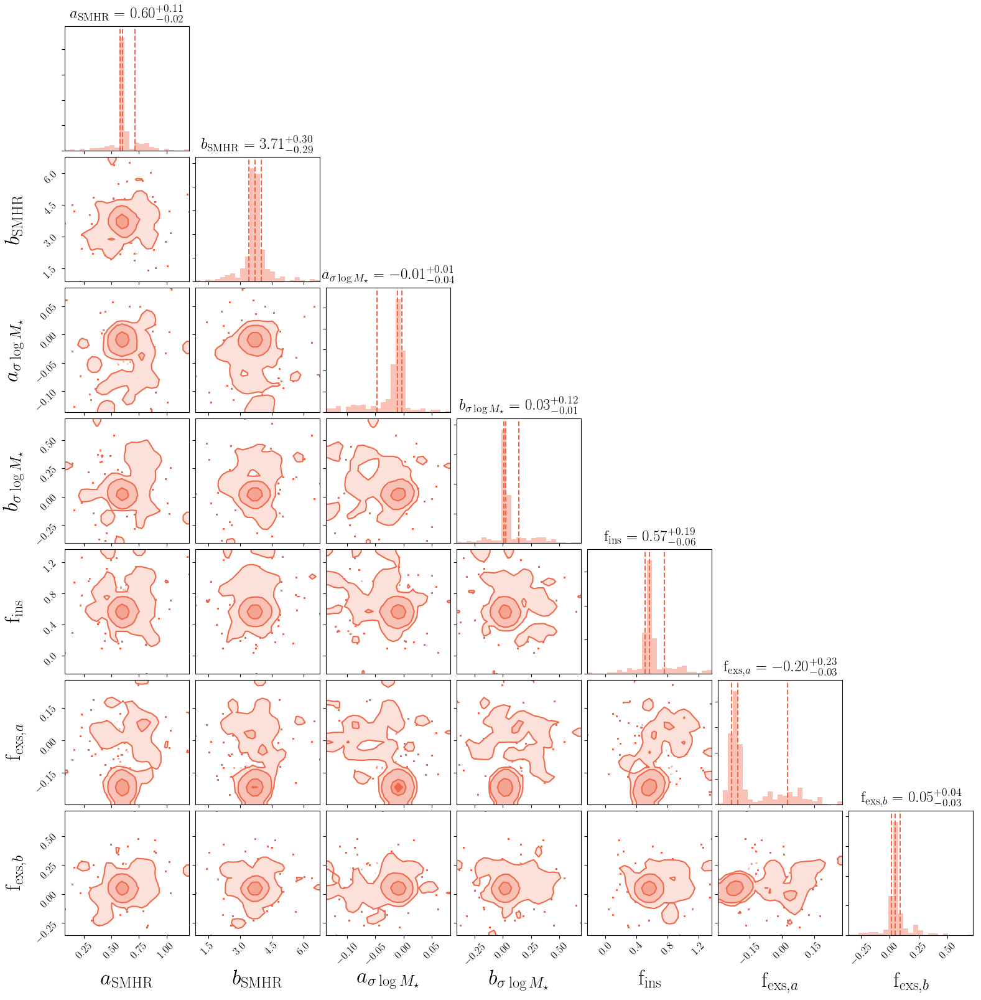

In [6]:
frac4a_corner = plot_mcmc_corner(frac4a_result_samples, cfg['mcmc_labels'])

#### Trace plot

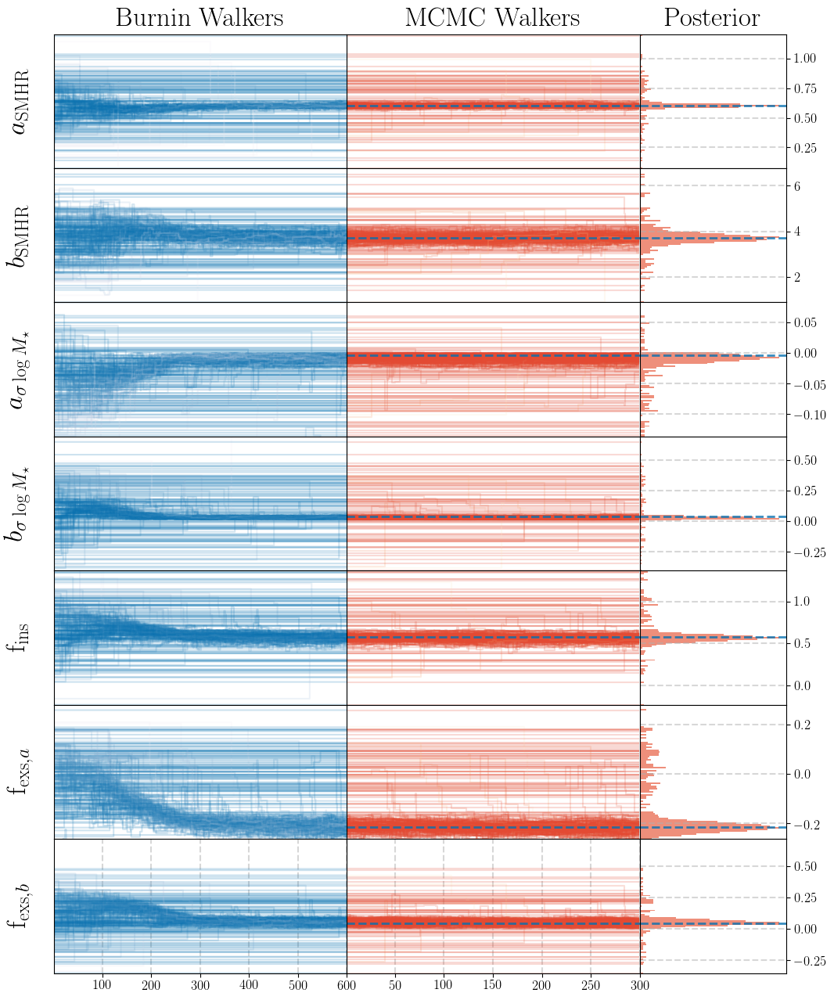

In [7]:
frac4a_trace = plot_mcmc_trace(frac4a_result_chains, 
                               cfg['mcmc_labels'],
                               mcmc_best=frac4a_result_best,
                               mcmc_burnin=frac4a_burnin_chains)

#### Best model 

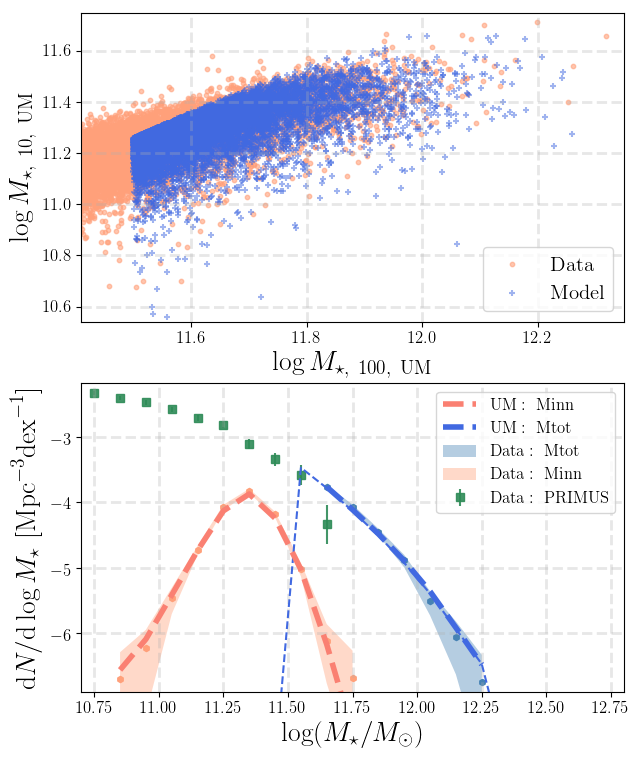

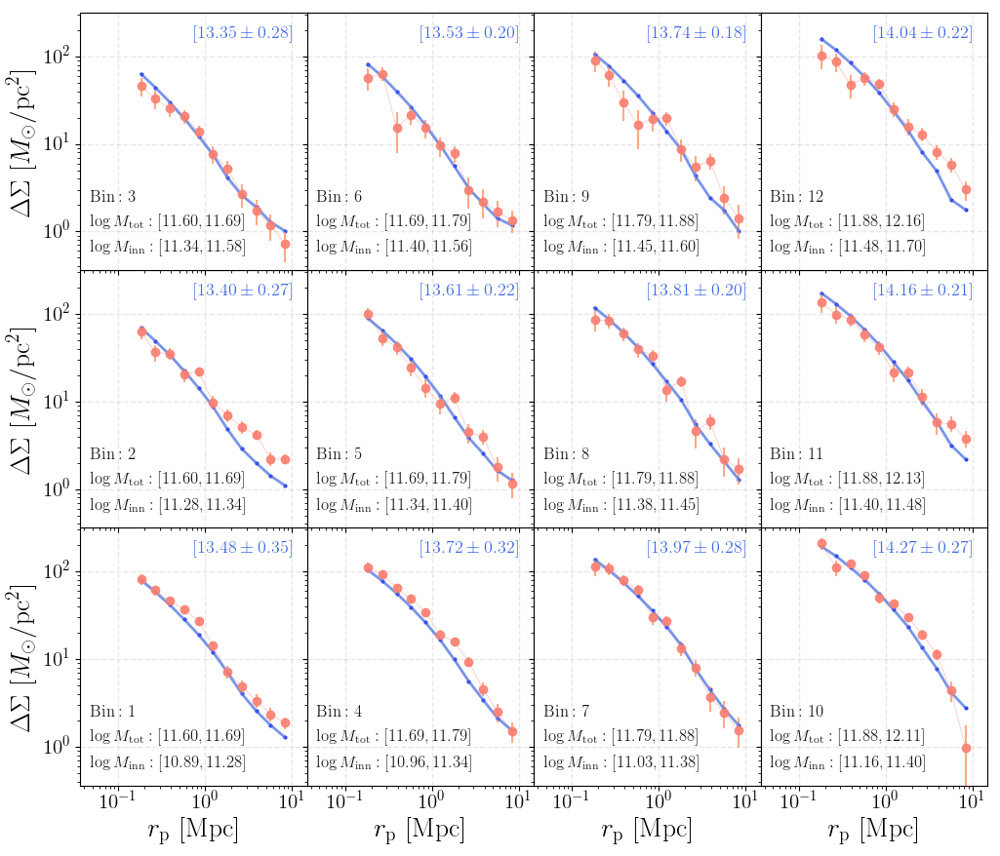

In [10]:
frac4a_model_prob = asap_predict_model_prob(frac4a_result_best, cfg, obs_data, um_data,  
                                            show_smf=True, show_dsigma=True, return_all=True)

um_smf_tot, um_smf_inn, um_dsigma, logms_mod_inn, logms_mod_tot, sig_logm = frac4a_model_prob

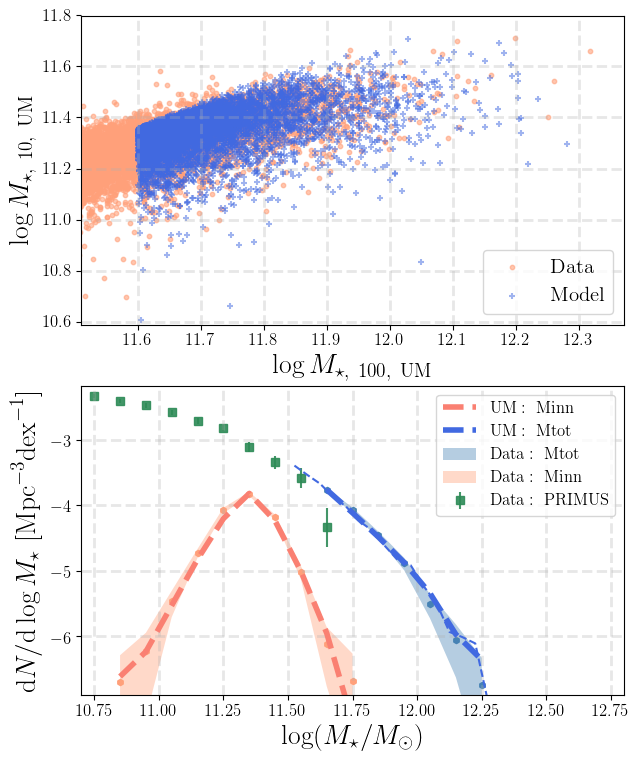

In [82]:
frac4a_model = asap_predict_model(frac4a_result_best, cfg, 
                                  obs_data, um_data, show_smf=True, return_all=True)

(um_smf_tot, um_smf_inn, um_dsigma, 
 logms_inn_mod_all, logms_tot_mod_all, 
 logms_halo_mod_all, mask_tot) = frac4a_model

#### Iso-halo mass trend

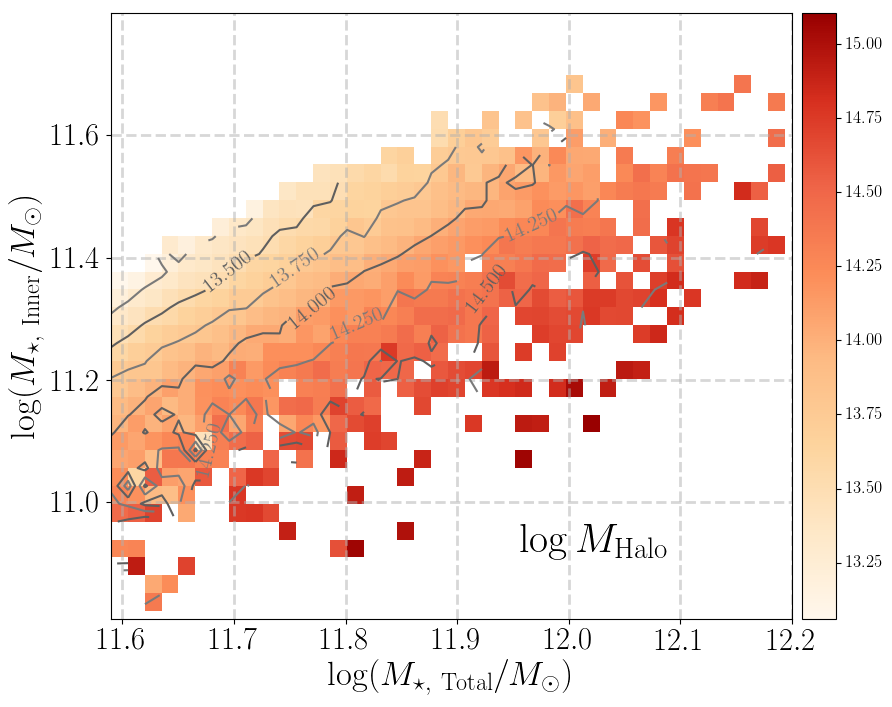

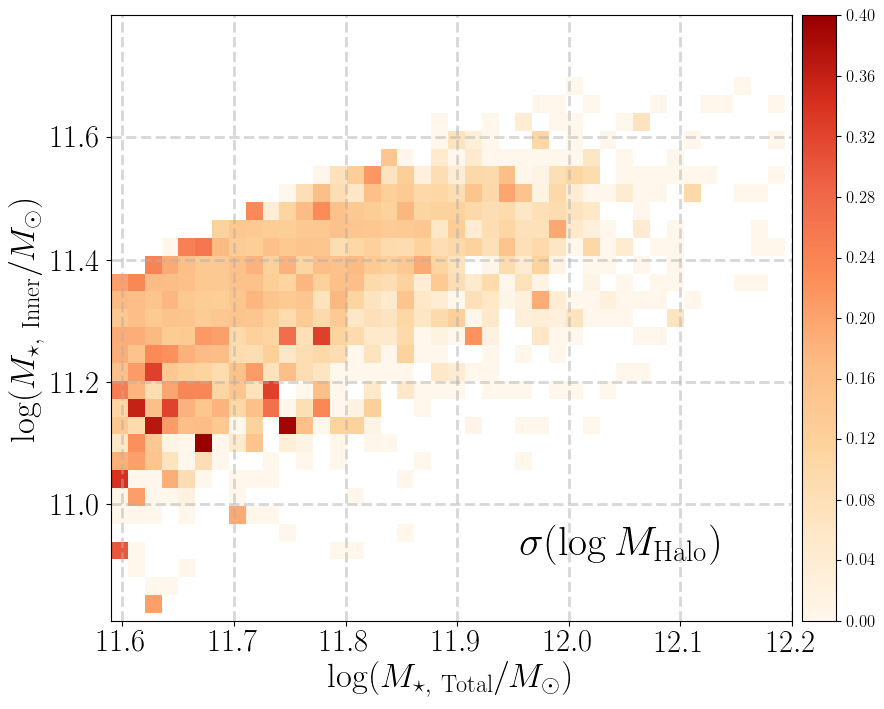

In [81]:
xx = logms_tot_mod_all
yy = logms_inn_mod_all
zz = um_mock['logmh_peak']

# Median halo mass
fig = plot_mtot_minn_trend(xx, yy, zz, method=np.mean, 
                           x_lim=[11.59, 12.2], y_lim=[10.81, 11.799],
                           n_contour=9)

# Scatter
fig = plot_mtot_minn_trend(xx, yy, zz, method=np.nanstd, contour=False,
                           x_lim=[11.59, 12.2], y_lim=[10.81, 11.799], 
                           title=r'$\sigma(\log M_{\mathrm{Halo}})$',
                           z_max=0.4)

#### Satellites fraction

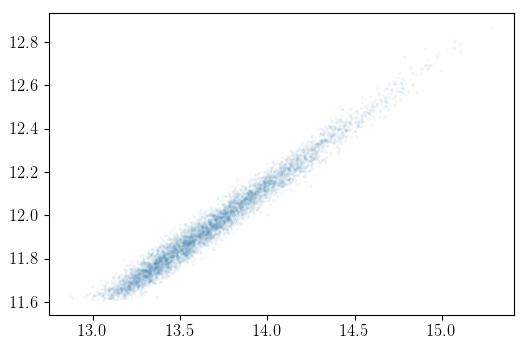

In [49]:
mask_central = um_mock['upid'] == -1

plt.scatter(um_mock['logmh_vir'][mask_central & mask_tot], 
            logms_halo_mod_all[mask_central & mask_tot], s=2, alpha=0.03)

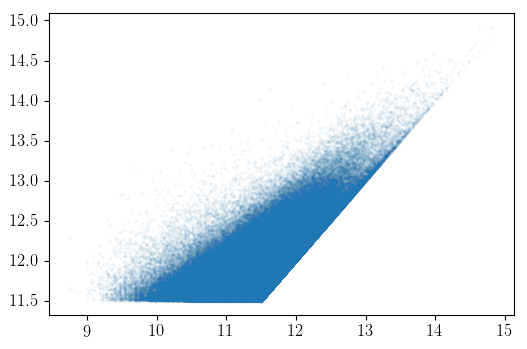

In [56]:
plt.scatter(um_mock['logmh_vir'][~mask_central], 
            um_mock['logmh_peak'][~mask_central], s=2, alpha=0.03)

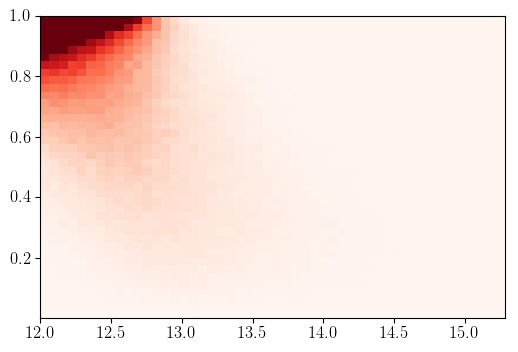

In [46]:
_ = plt.hist2d(um_mock['logmh_vir'][mask_central], 
               um_mock['frac_cen_tot'][mask_central], bins=[50, 40], 
               cmap='Reds', vmax=1500)

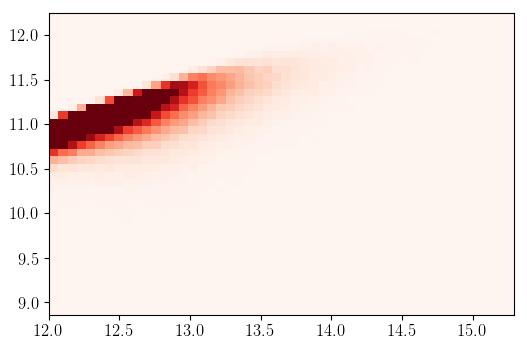

In [47]:
_ = plt.hist2d(um_mock['logmh_vir'][mask_central], 
               logms_tot_mod_all[mask_central], bins=[50, 40],
               cmap='Reds', vmax=1500)

/Users/song/Dropbox/work/project/hsc_um2/asap/um_model_plot.py:834: RuntimeWarning: Mean of empty slice
  sigmh_all = [np.nanstd(logmh_all[idx_logms_all == k])


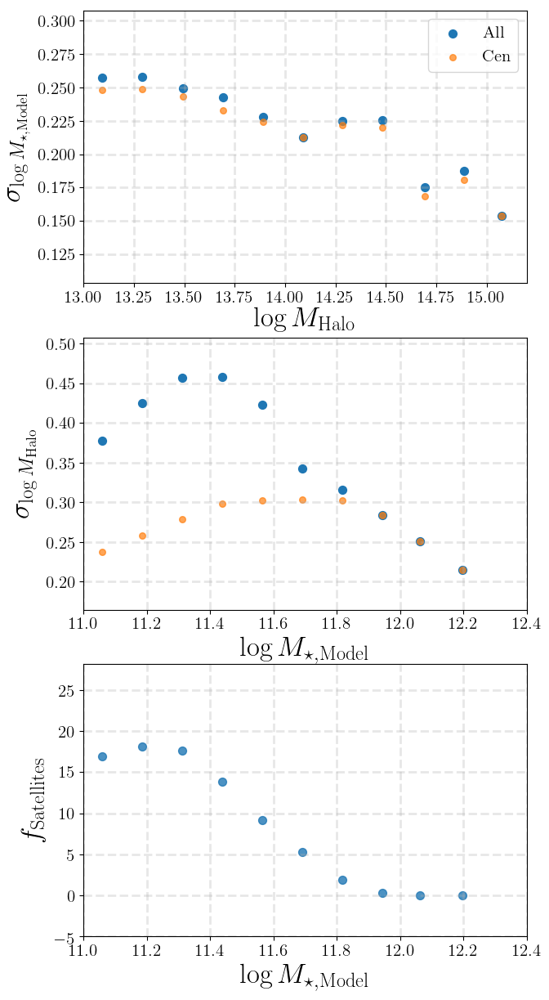

In [74]:
fig = plot_mass_scatter_fsat_trends(um_mock, logms_tot_mod_all, nbin=12)

### Result 2

* Greymalkin
* `walk` move
* 512 Walkers; 1500 burn-in; 500 run

In [14]:
(frac4b_burnin_samples, 
 frac4b_burnin_chains, 
 frac4b_burnin_lnprob, 
 frac4b_burnin_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_7_burnin.npz')

(frac4b_result_samples, 
 frac4b_result_chains, 
 frac4b_result_lnprob, 
 frac4b_result_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_7_run.npz')

print(np.nanmax(frac4b_burnin_lnprob), frac4b_burnin_best)
print(np.nanmax(frac4b_result_lnprob), frac4b_result_best)

(-195.20131721268234, array([ 5.90058371e-01,  3.88716828e+00, -2.77825995e-03,  4.04516022e-02,
        5.02972972e-01, -2.24057808e-01,  7.79513016e-02]))
(-192.76156232340895, array([ 6.65430246e-01,  2.85145458e+00, -2.17178201e-03,  1.88268187e-02,
        4.77423551e-01, -1.90275353e-01,  8.90289654e-02]))


#### Corner plot

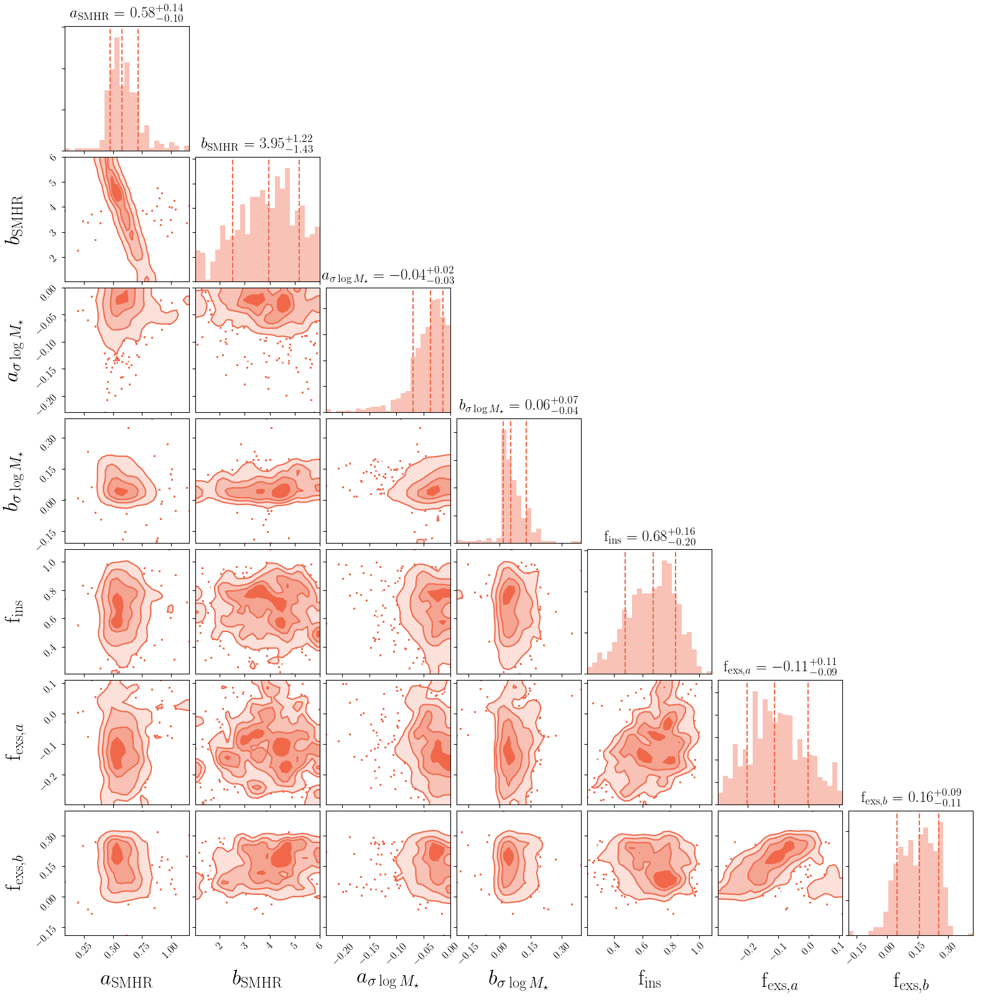

In [15]:
frac4b_corner = plot_mcmc_corner(frac4b_result_samples, cfg['mcmc_labels'])

#### Trace plot

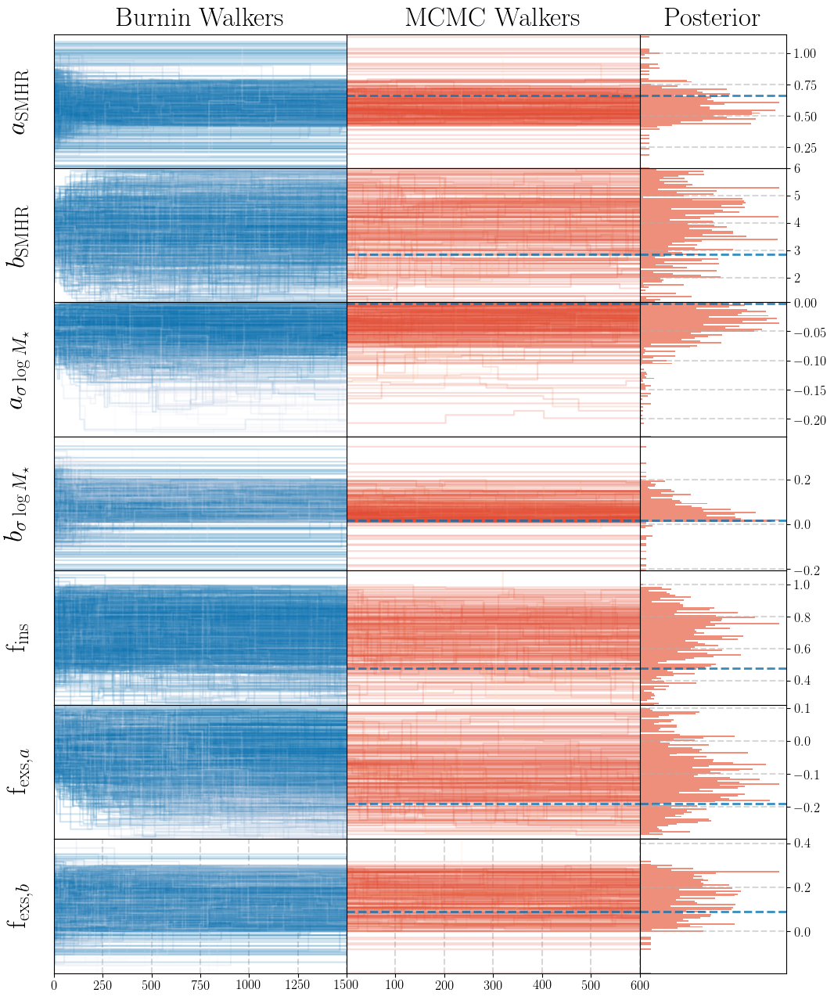

In [16]:
frac4b_trace = plot_mcmc_trace(frac4b_result_chains, 
                               cfg['mcmc_labels'],
                               mcmc_best=frac4b_result_best,
                               mcmc_burnin=frac4b_burnin_chains)

### Result 3 

* Greymalkin
* `kde` move
* 256 Walkers; 800 burn-in; 400 run

In [30]:
(frac4c_burnin_samples, 
 frac4c_burnin_chains, 
 frac4c_burnin_lnprob, 
 frac4c_burnin_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_8_burnin.npz')

(frac4c_result_samples, 
 frac4c_result_chains, 
 frac4c_result_lnprob, 
 frac4c_result_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_8_run.npz')

print(np.nanmax(frac4c_burnin_lnprob), frac4c_burnin_best)
print(np.nanmax(frac4c_result_lnprob), frac4c_result_best)

(-164.2131232628799, array([ 0.60281009,  3.69632828, -0.0068337 ,  0.02715988,  0.56596831,
       -0.21650687,  0.04993421]))
(-164.21159261986145, array([ 0.60407446,  3.67886639, -0.00737083,  0.02720193,  0.56141197,
       -0.22146492,  0.04160477]))


#### Corner plot

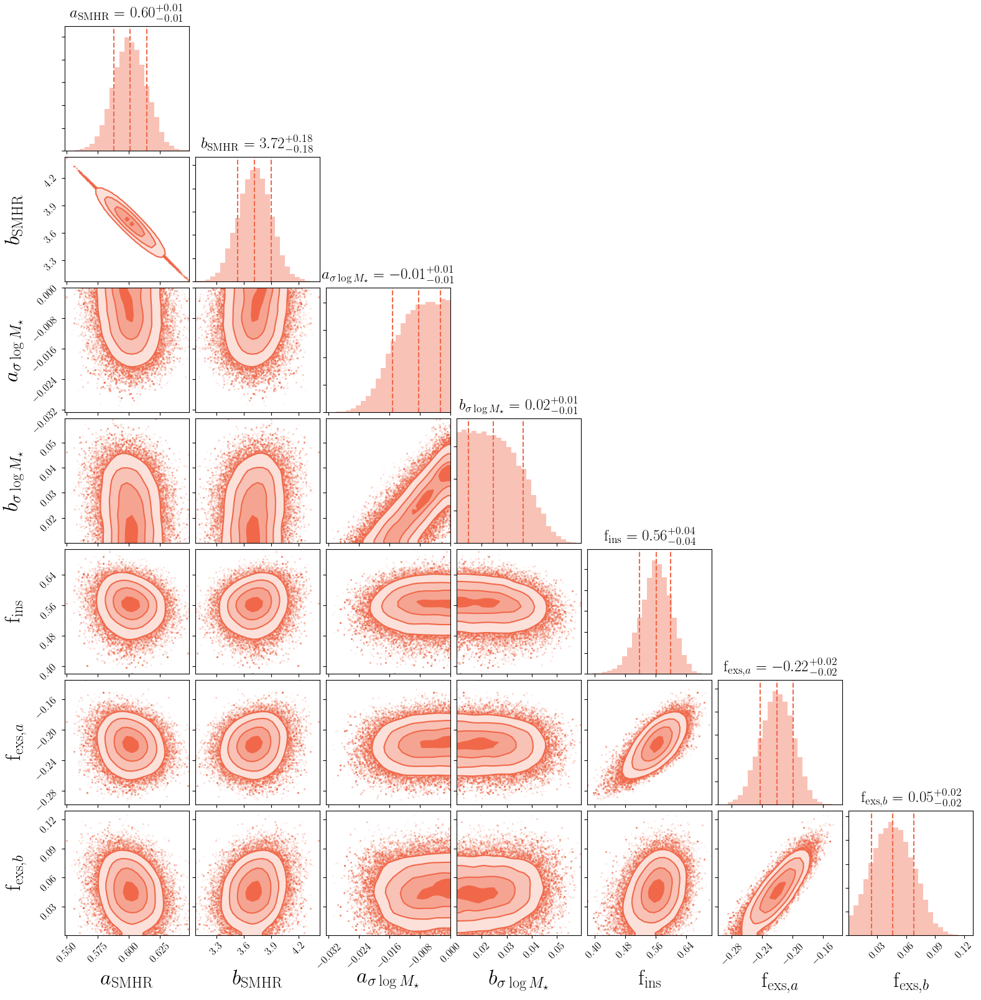

In [31]:
frac4c_corner = plot_mcmc_corner(frac4c_result_samples, cfg['mcmc_labels'])

#### Trace plot

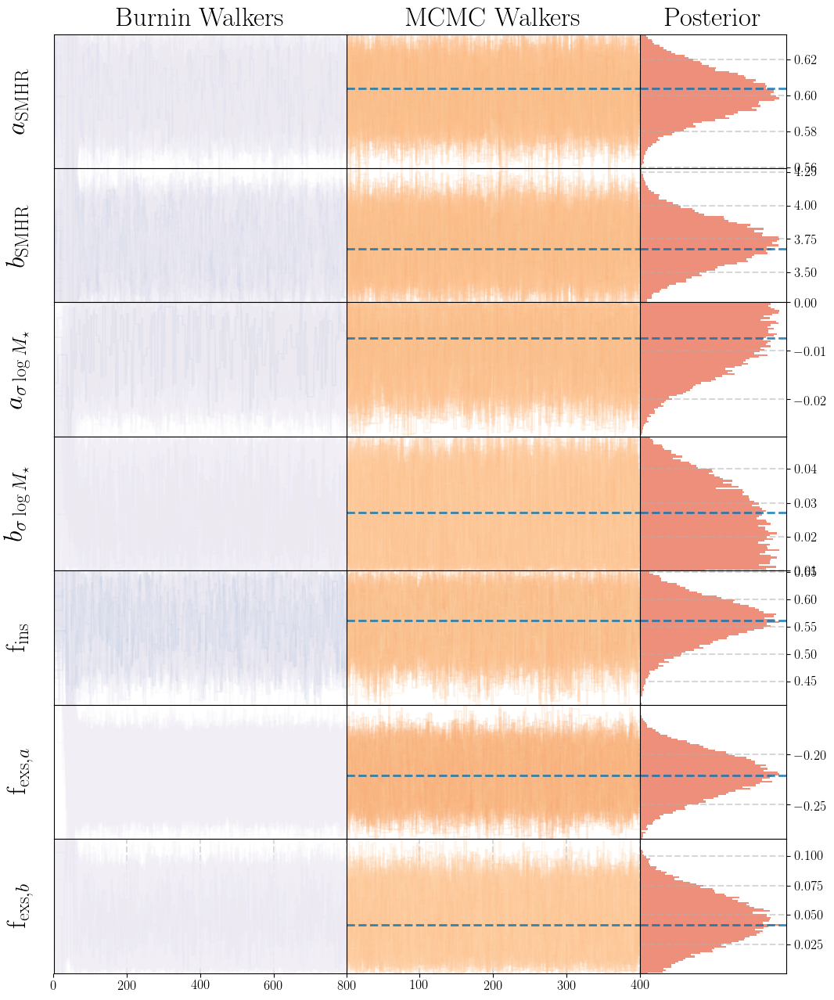

In [32]:
frac4c_trace = plot_mcmc_trace(frac4c_result_chains, 
                               cfg['mcmc_labels'],
                               mcmc_best=frac4c_result_best,
                               mcmc_burnin=frac4c_burnin_chains)

#### Best model 

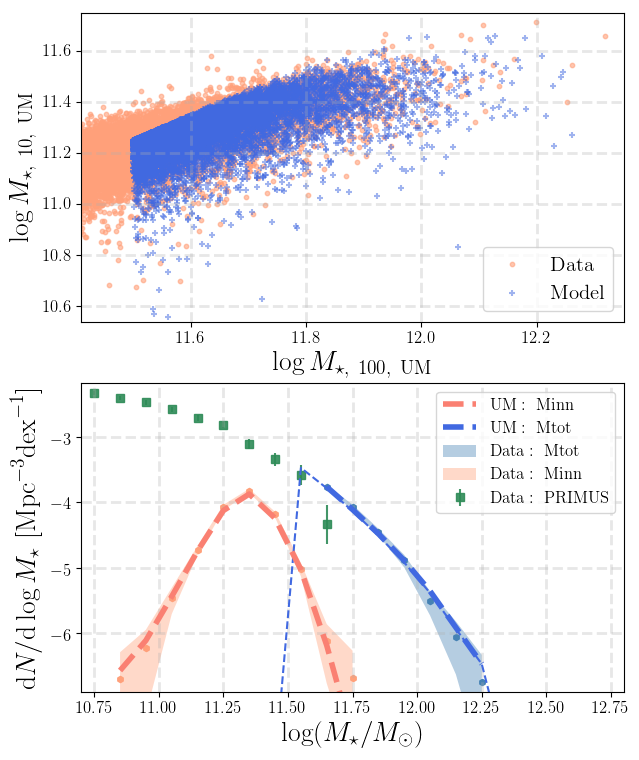

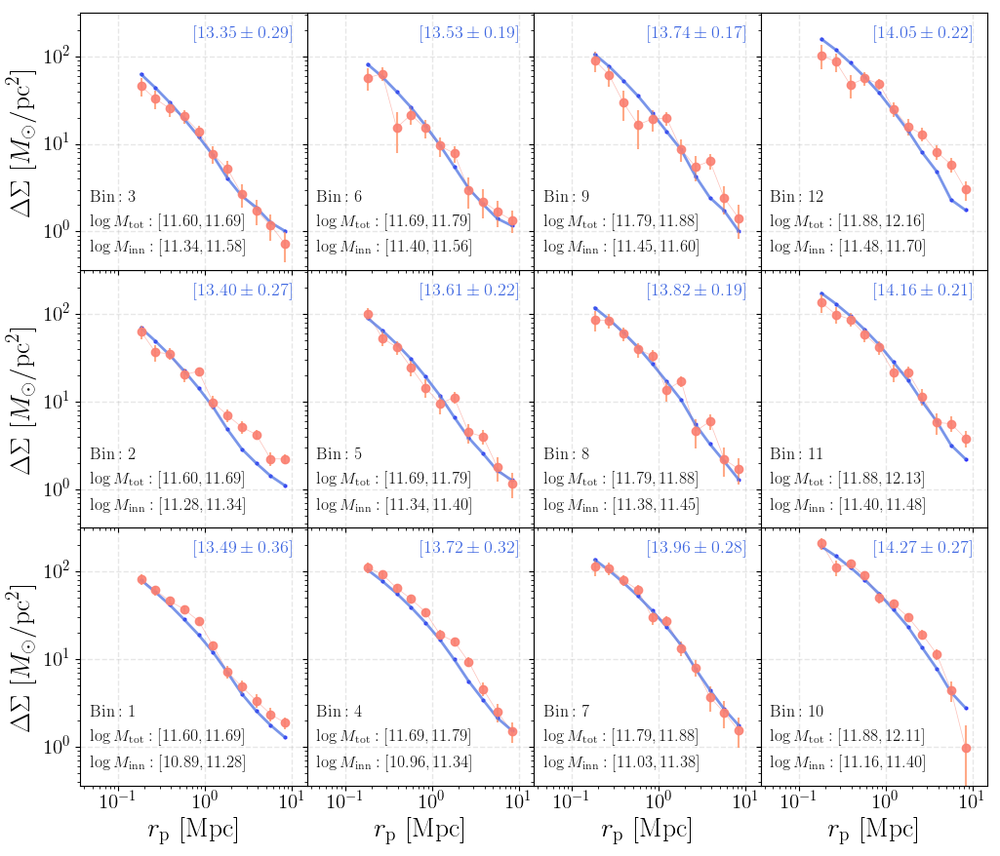

In [33]:
frac4c_model_prob = asap_predict_model_prob(frac4c_result_best, cfg, obs_data, um_data,  
                                            show_smf=True, show_dsigma=True, return_all=True)

um_smf_tot, um_smf_inn, um_dsigma, logms_mod_inn, logms_mod_tot, sig_logm = frac4c_model_prob

### Result 4 

* Greymalkin
* Using `logmh_vir` instead of `logmh_host`
* `stretch` move, `a=4`
* 256 walkers; 400 burn-in; 300 runs

In [86]:
(frac4d_burnin_samples, 
 frac4d_burnin_chains, 
 frac4d_burnin_lnprob, 
 frac4d_burnin_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_9_burnin.npz')

(frac4d_result_samples, 
 frac4d_result_chains, 
 frac4d_result_lnprob, 
 frac4d_result_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_9_run.npz')

print(np.nanmax(frac4d_burnin_lnprob), frac4d_burnin_best)
print(np.nanmax(frac4d_result_lnprob), frac4d_result_best)

(-174.39290137086002, array([ 0.58729287,  3.90861903, -0.00520669,  0.02939244,  0.57626579,
       -0.21214103,  0.04843184]))
(-174.3786701769592, array([ 0.58395106,  3.9538863 , -0.00512847,  0.02936996,  0.57797475,
       -0.21602934,  0.04135145]))


#### Corner plot

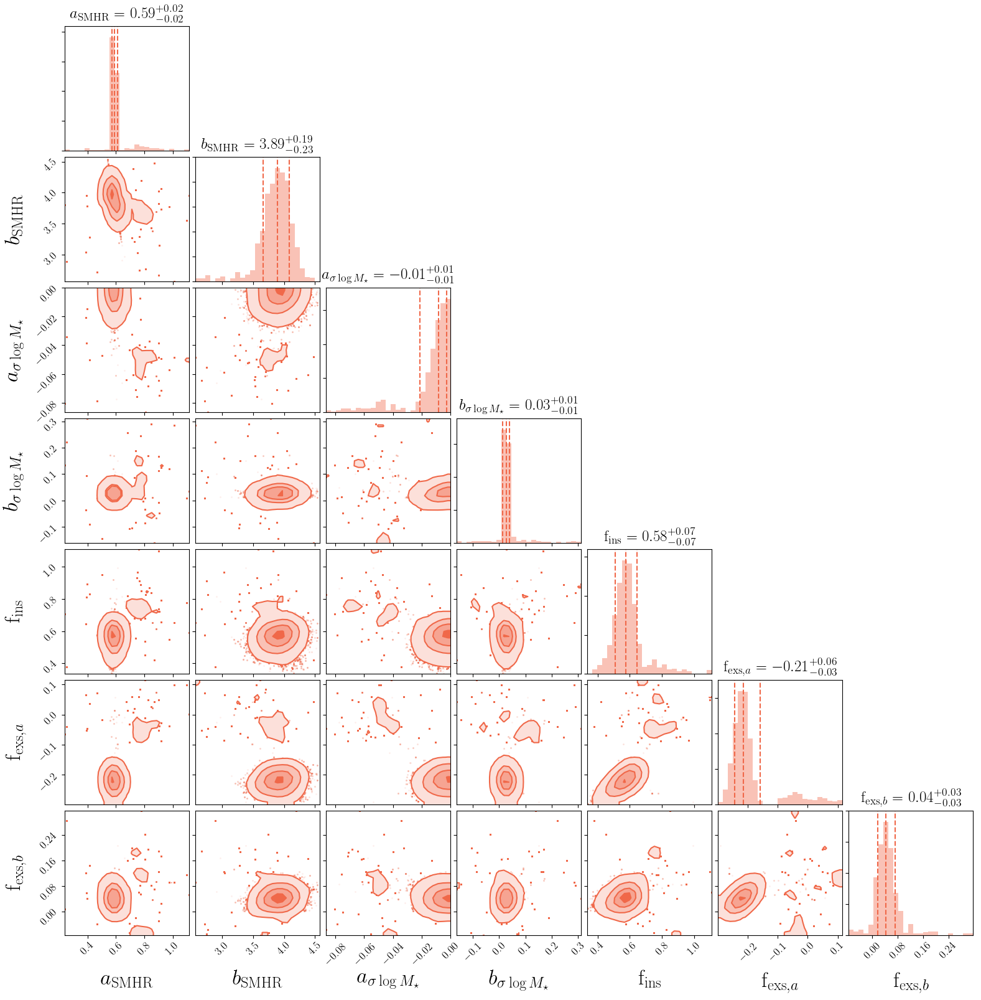

In [87]:
frac4d_corner = plot_mcmc_corner(frac4d_result_samples, cfg['mcmc_labels'])

#### Trace plot

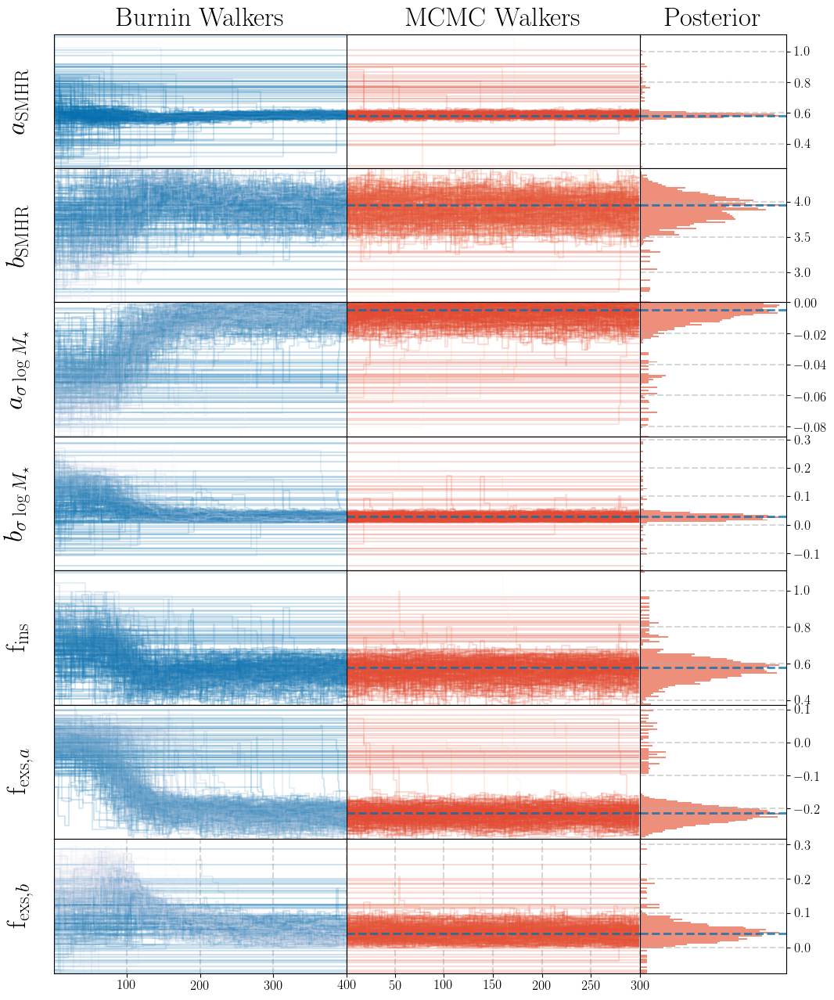

In [88]:
frac4d_trace = plot_mcmc_trace(frac4d_result_chains, 
                               cfg['mcmc_labels'],
                               mcmc_best=frac4d_result_best,
                               mcmc_burnin=frac4d_burnin_chains)

#### Best model 

In [93]:
print(frac4d_result_best)

[ 0.58395106  3.9538863  -0.00512847  0.02936996  0.57797475 -0.21602934
  0.04135145]


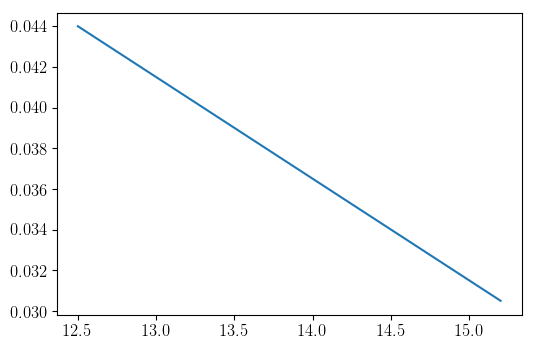

In [96]:
logmh = np.linspace(12.5, 15.2, 100)
sigms = sigma_logms_from_logmh(logmh, -0.005, 0.03)

plt.plot(logmh, sigms)

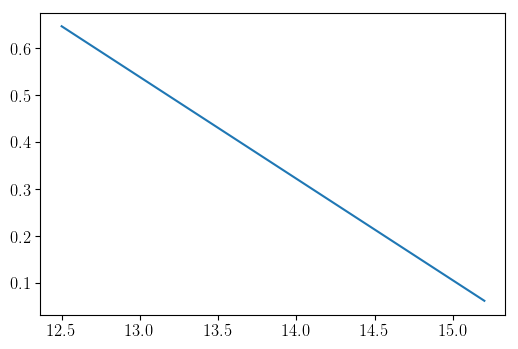

In [97]:
frac = frac_from_logmh(logmh, -0.216, 0.0413)

plt.plot(logmh, frac)

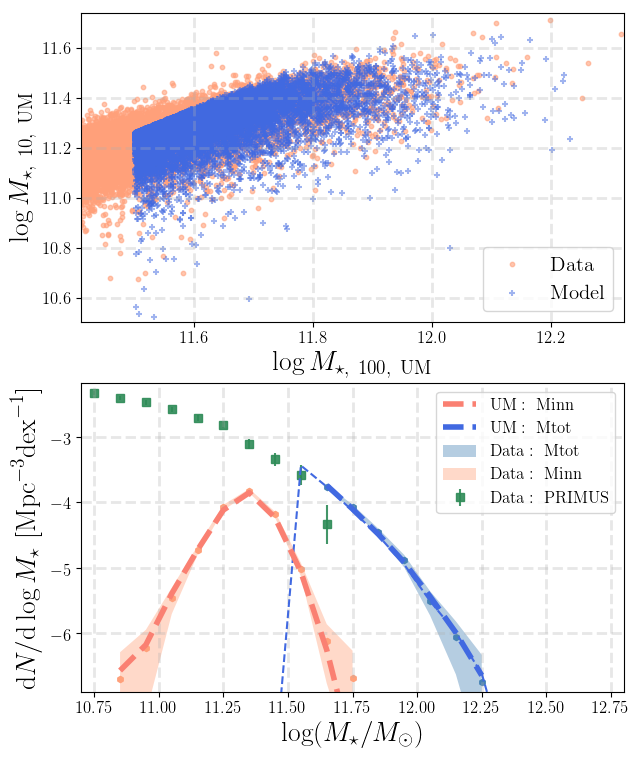

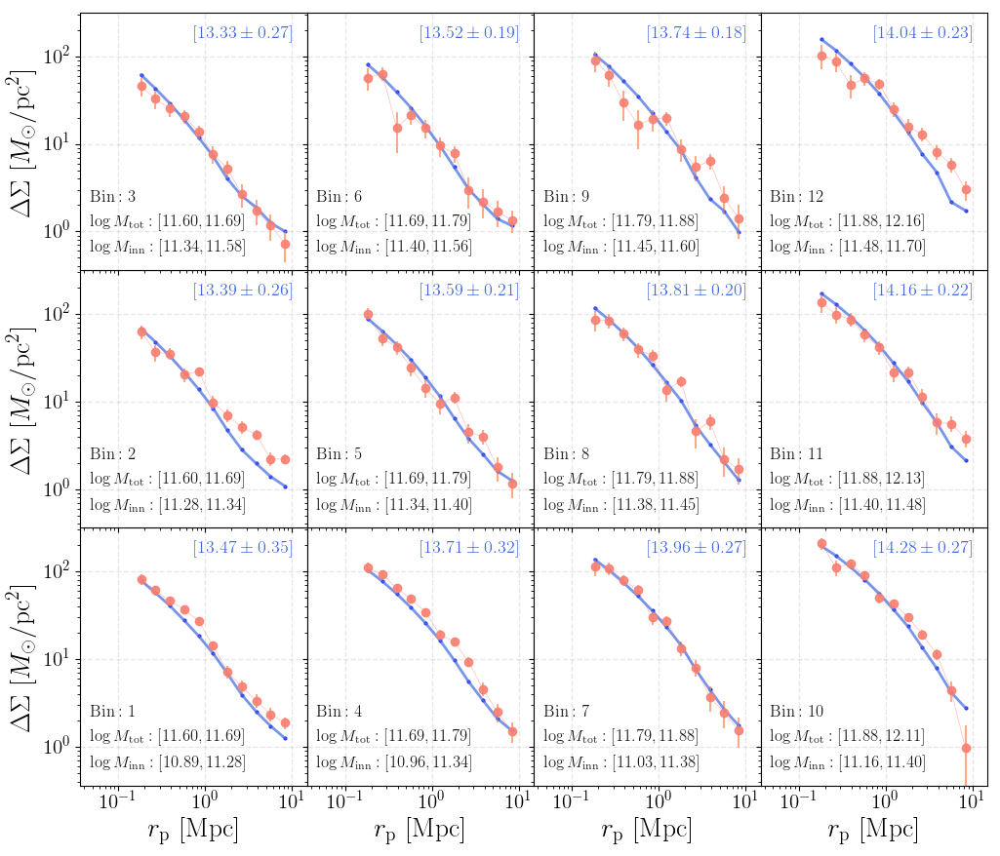

In [89]:
frac4d_model_prob = asap_predict_model_prob(frac4d_result_best, cfg, obs_data, um_data,  
                                            show_smf=True, show_dsigma=True, return_all=True)

um_smf_tot, um_smf_inn, um_dsigma, logms_mod_inn, logms_mod_tot, sig_logm = frac4d_model_prob

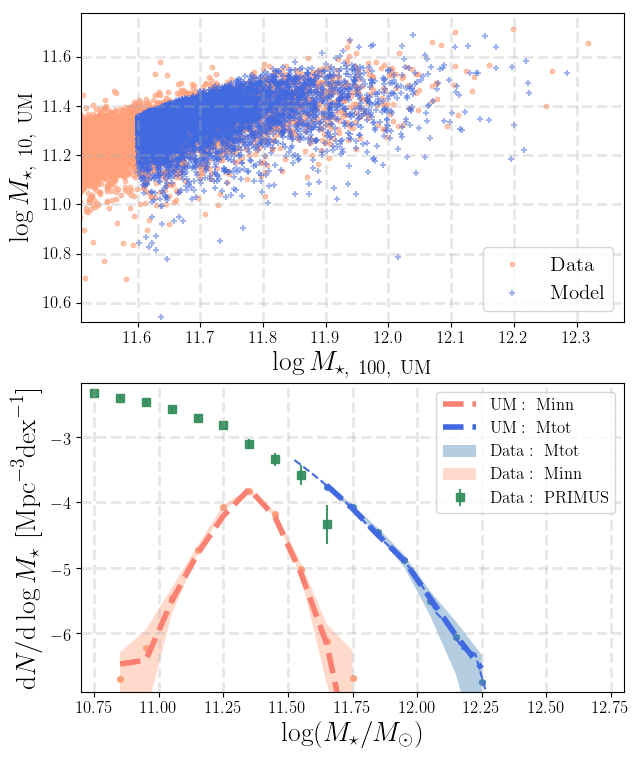

In [90]:
frac4d_model = asap_predict_model(frac4d_result_best, cfg, 
                                  obs_data, um_data, show_smf=True, return_all=True)

(um_smf_tot, um_smf_inn, um_dsigma, 
 logms_inn_mod_all, logms_tot_mod_all, 
 logms_halo_mod_all, mask_tot) = frac4d_model

#### Iso-halo mass trend

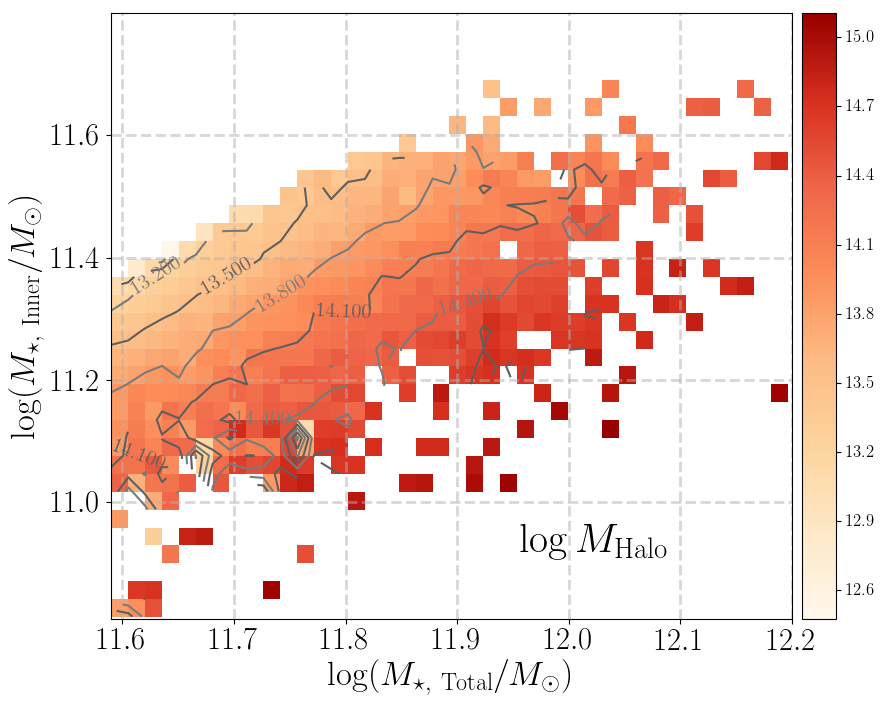

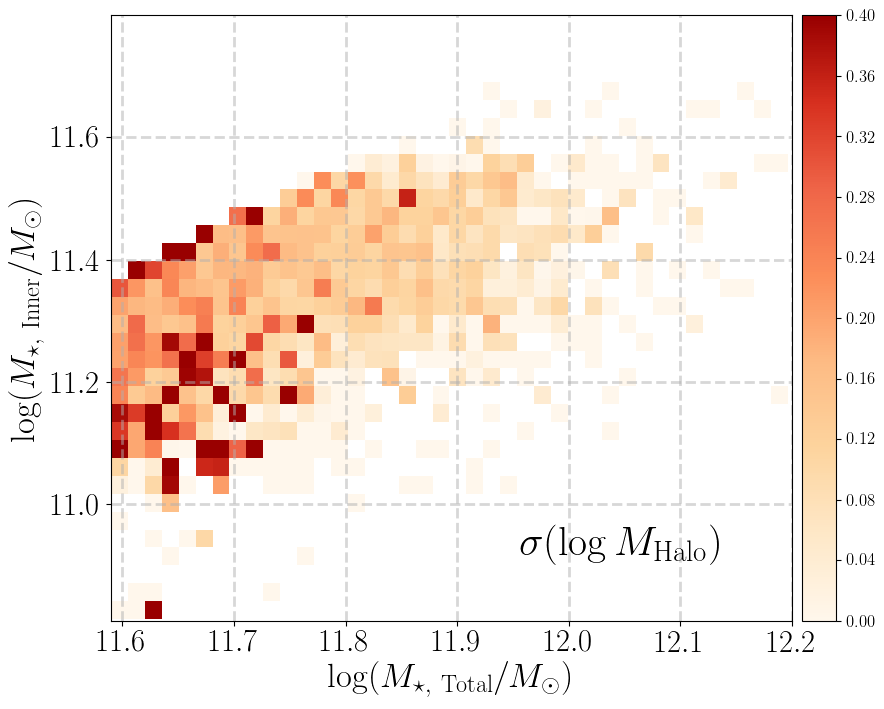

In [103]:
xx = logms_tot_mod_all
yy = logms_inn_mod_all
zz = um_mock['logmh_vir']

# Median halo mass
fig = plot_mtot_minn_trend(xx, yy, zz, method=np.mean, 
                           x_lim=[11.59, 12.2], y_lim=[10.81, 11.799],
                           n_contour=9)

# Scatter
fig = plot_mtot_minn_trend(xx, yy, zz, method=np.nanstd, contour=False,
                           x_lim=[11.59, 12.2], y_lim=[10.81, 11.799], 
                           title=r'$\sigma(\log M_{\mathrm{Halo}})$',
                           z_max=0.4)

#### Satellite fraction

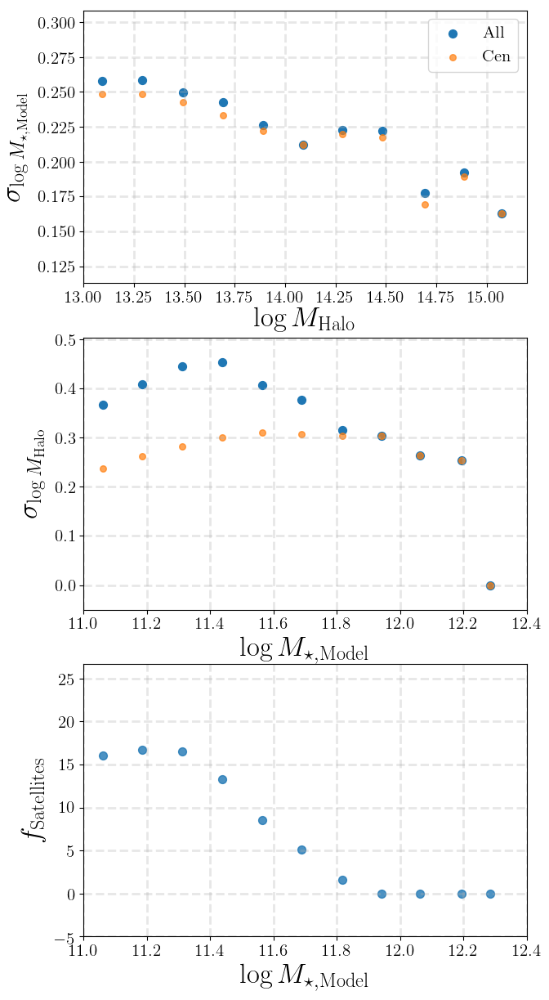

In [92]:
fig = plot_mass_scatter_fsat_trends(um_mock, logms_tot_mod_all, nbin=12)

### Result 5

* Greymalkin
* Using `logmh_peak` instead of `logmh_host`
* `stretch` move; `a=4`
* 256 Walkers; 400 burn-in; 300 runs

In [98]:
(frac4e_burnin_samples, 
 frac4e_burnin_chains, 
 frac4e_burnin_lnprob, 
 frac4e_burnin_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_10_burnin.npz')

(frac4e_result_samples, 
 frac4e_result_chains, 
 frac4e_result_lnprob, 
 frac4e_result_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_10_run.npz')

print(np.nanmax(frac4e_burnin_lnprob), frac4e_burnin_best)
print(np.nanmax(frac4e_result_lnprob), frac4e_result_best)

(-171.11755031767024, array([ 0.59528236,  3.79595928, -0.00532034,  0.02721617,  0.59735244,
       -0.21150378,  0.04285386]))
(-170.9320368692725, array([ 0.58858769,  3.88365801, -0.00457893,  0.02882596,  0.58116876,
       -0.21649014,  0.04193368]))


#### Corner plot

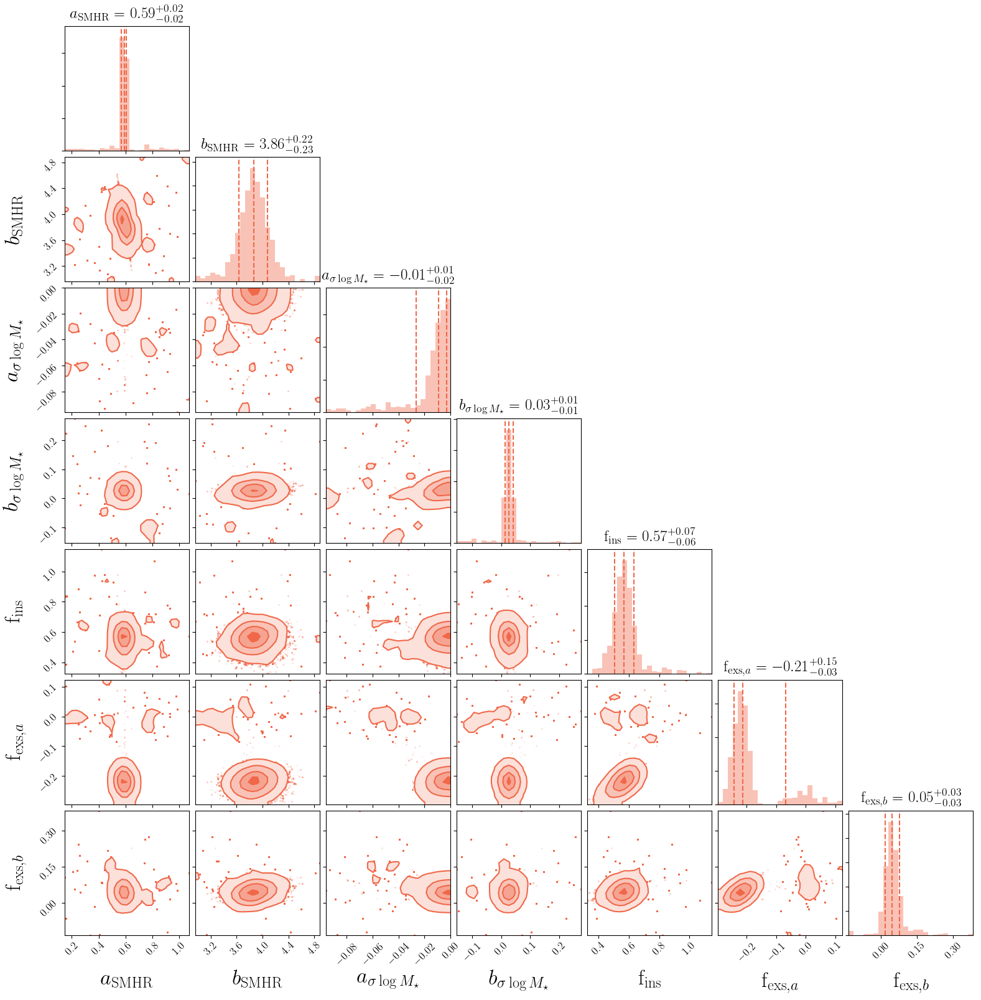

In [99]:
frac4e_corner = plot_mcmc_corner(frac4e_result_samples, cfg['mcmc_labels'])

#### Trace plot

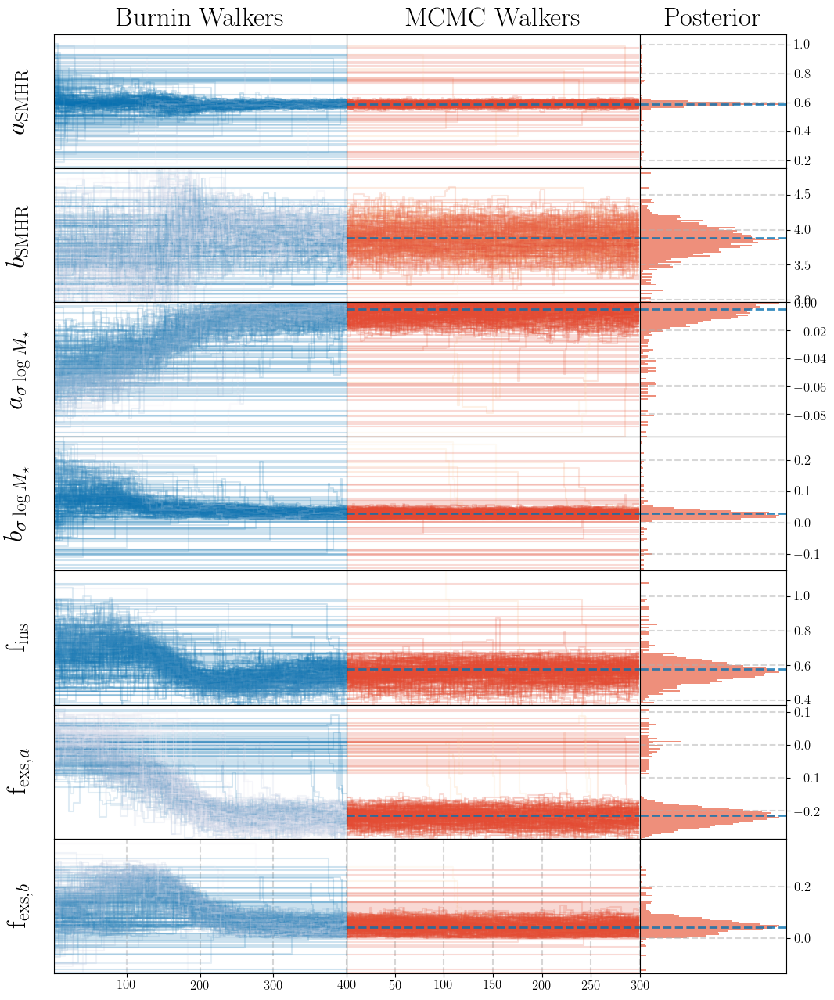

In [100]:
frac4e_trace = plot_mcmc_trace(frac4e_result_chains, 
                               cfg['mcmc_labels'],
                               mcmc_best=frac4e_result_best,
                               mcmc_burnin=frac4e_burnin_chains)

#### Best model

In [102]:
print(frac4e_result_best)

[ 0.58858769  3.88365801 -0.00457893  0.02882596  0.58116876 -0.21649014
  0.04193368]


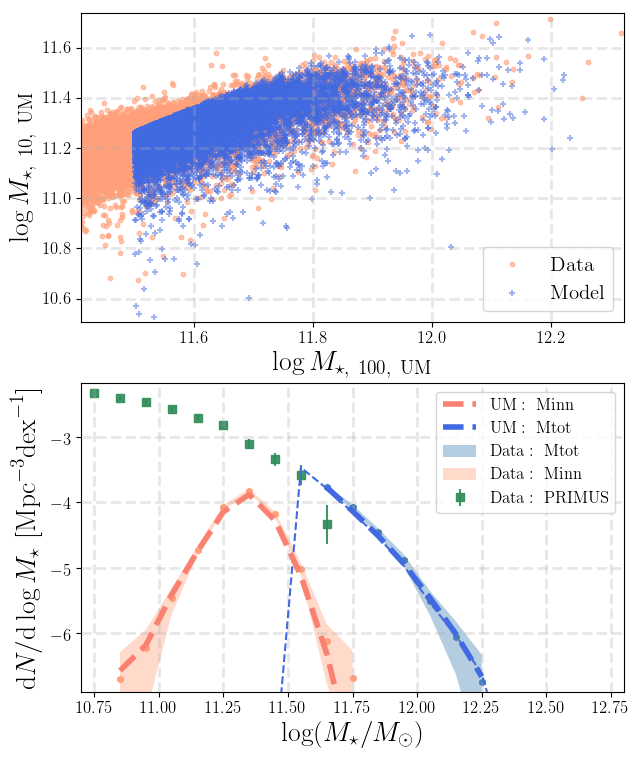

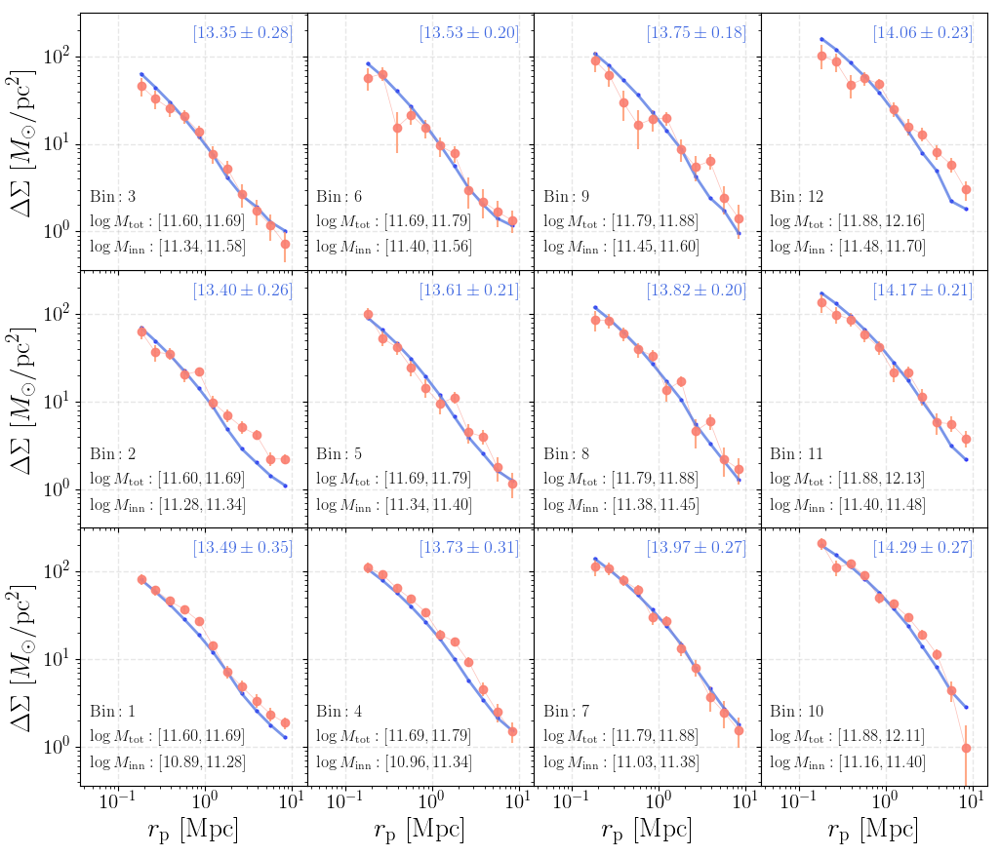

In [101]:
frac4e_model_prob = asap_predict_model_prob(frac4e_result_best, cfg, obs_data, um_data,  
                                            show_smf=True, show_dsigma=True, return_all=True)

um_smf_tot, um_smf_inn, um_dsigma, logms_mod_inn, logms_mod_tot, sig_logm = frac4e_model_prob

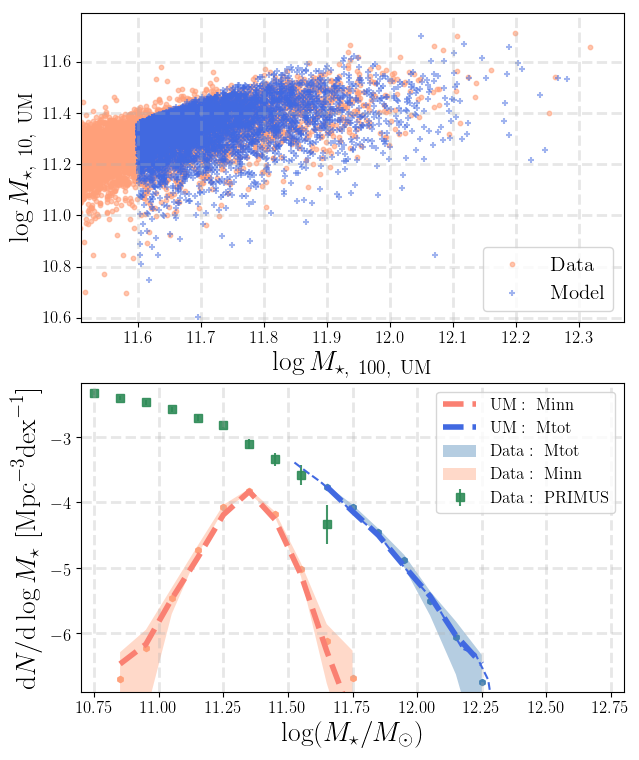

In [104]:
frac4e_model = asap_predict_model(frac4e_result_best, cfg, 
                                  obs_data, um_data, show_smf=True, return_all=True)

(um_smf_tot, um_smf_inn, um_dsigma, 
 logms_inn_mod_all, logms_tot_mod_all, 
 logms_halo_mod_all, mask_tot) = frac4e_model

#### Iso-halo mass trend

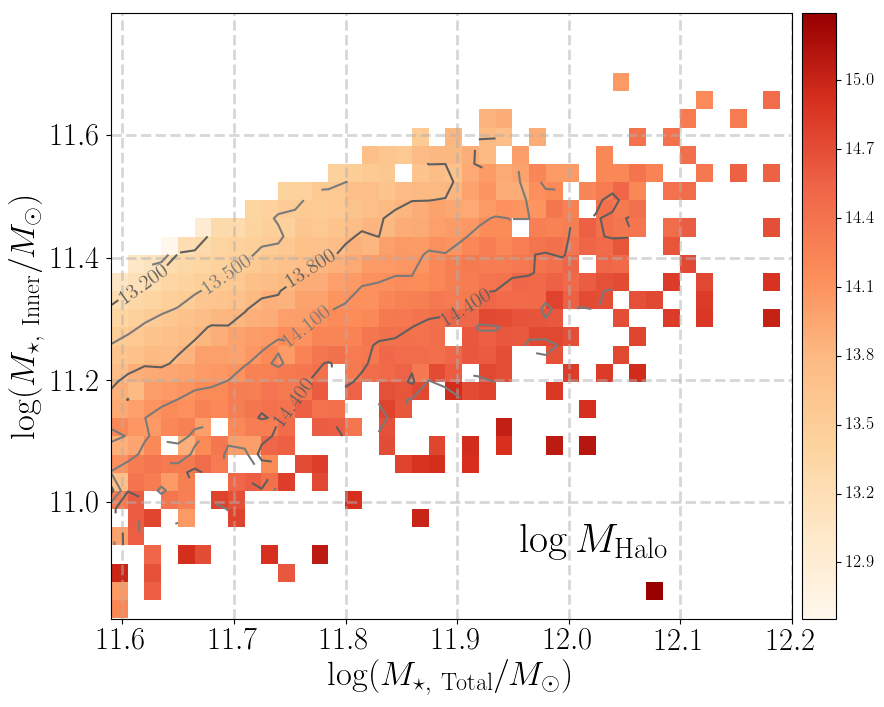

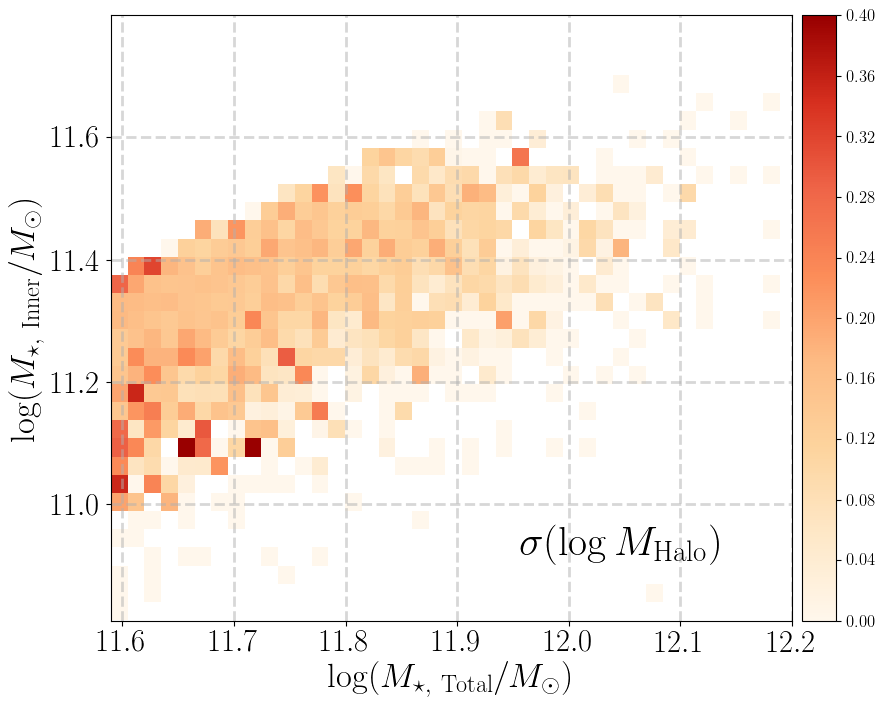

In [105]:
xx = logms_tot_mod_all
yy = logms_inn_mod_all
zz = um_mock['logmh_peak']

# Median halo mass
fig = plot_mtot_minn_trend(xx, yy, zz, method=np.mean, 
                           x_lim=[11.59, 12.2], y_lim=[10.81, 11.799],
                           n_contour=9)

# Scatter
fig = plot_mtot_minn_trend(xx, yy, zz, method=np.nanstd, contour=False,
                           x_lim=[11.59, 12.2], y_lim=[10.81, 11.799], 
                           title=r'$\sigma(\log M_{\mathrm{Halo}})$',
                           z_max=0.4)

#### Satellite fraction

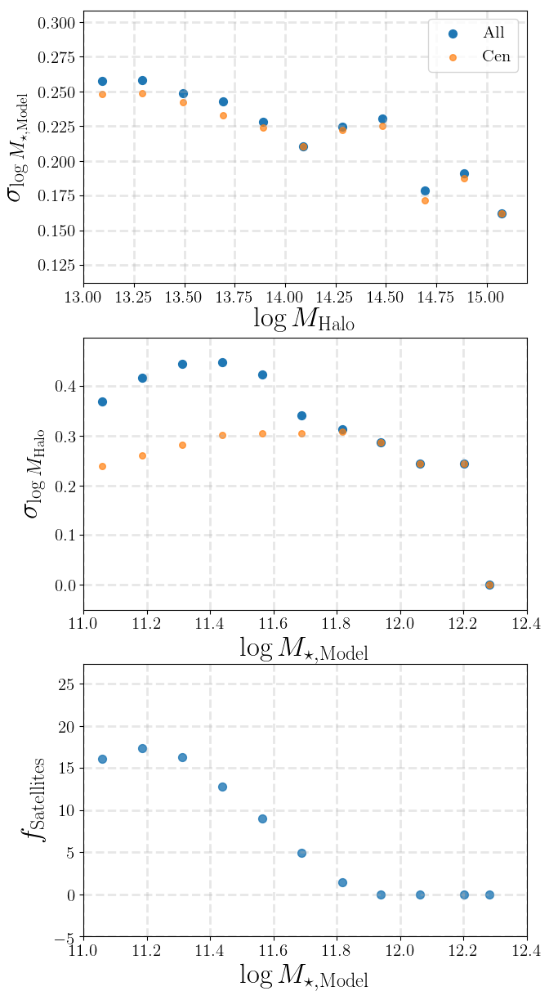

In [106]:
fig = plot_mass_scatter_fsat_trends(um_mock, logms_tot_mod_all, nbin=12)

### Result 6

* Greymalkin
* Using `logmh_peak`
* `snooker` move
* 256 Walkers; 600 burn-in; 300 runs

In [18]:
(frac4f_burnin_samples, 
 frac4f_burnin_chains, 
 frac4f_burnin_lnprob, 
 frac4f_burnin_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_11_burnin.npz')

(frac4f_result_samples, 
 frac4f_result_chains, 
 frac4f_result_lnprob, 
 frac4f_result_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_11_run.npz')

print(np.nanmax(frac4f_burnin_lnprob), frac4f_burnin_best)
print(np.nanmax(frac4f_result_lnprob), frac4f_result_best)

(-170.7970767170579, array([ 0.58751256,  3.89832193, -0.00403216,  0.03177745,  0.58467956,
       -0.21488112,  0.04335083]))
(-170.78655759004945, array([ 5.86785813e-01,  3.90766875e+00, -3.43075329e-03,  3.32348221e-02,
        5.86547508e-01, -2.10733154e-01,  4.78538431e-02]))


#### Corner plot 

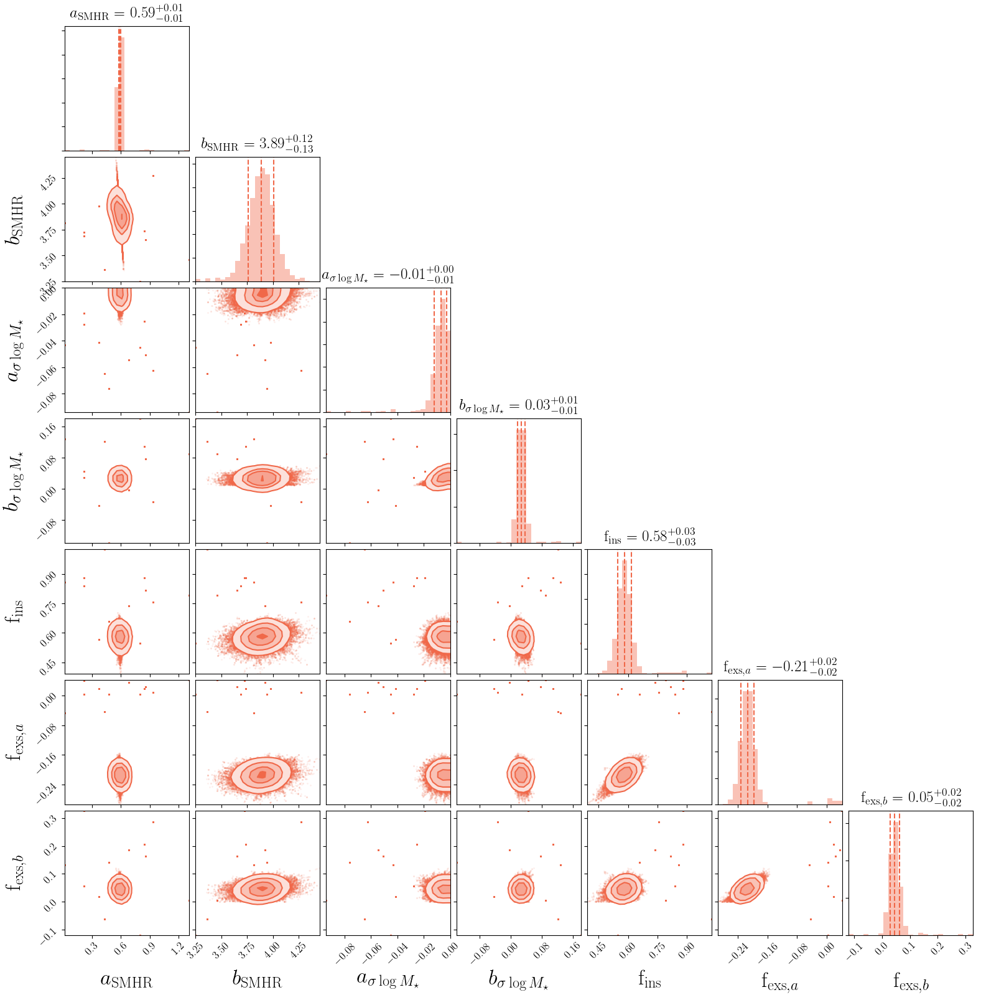

In [19]:
frac4f_corner = plot_mcmc_corner(frac4f_result_samples, cfg['mcmc_labels'])

#### Trace plot

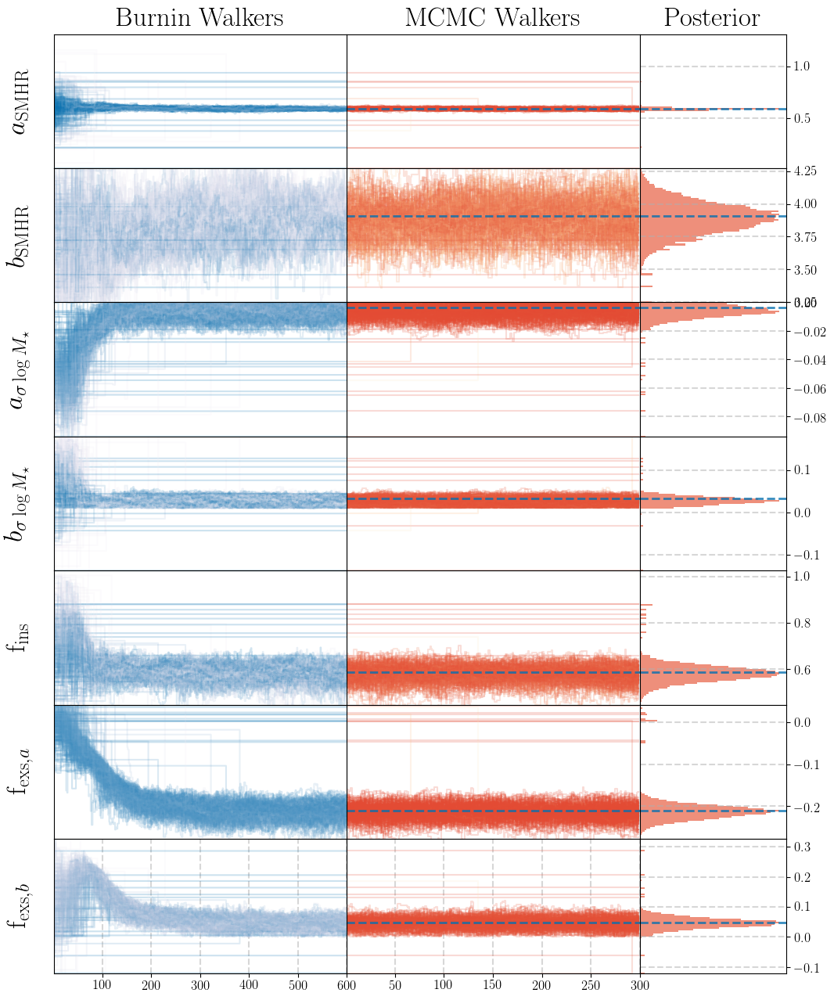

In [20]:
frac4f_trace = plot_mcmc_trace(frac4f_result_chains, 
                               cfg['mcmc_labels'],
                               mcmc_best=frac4f_result_best,
                               mcmc_burnin=frac4f_burnin_chains)

#### Best Model

In [21]:
print(frac4f_result_best)

[ 5.86785813e-01  3.90766875e+00 -3.43075329e-03  3.32348221e-02
  5.86547508e-01 -2.10733154e-01  4.78538431e-02]


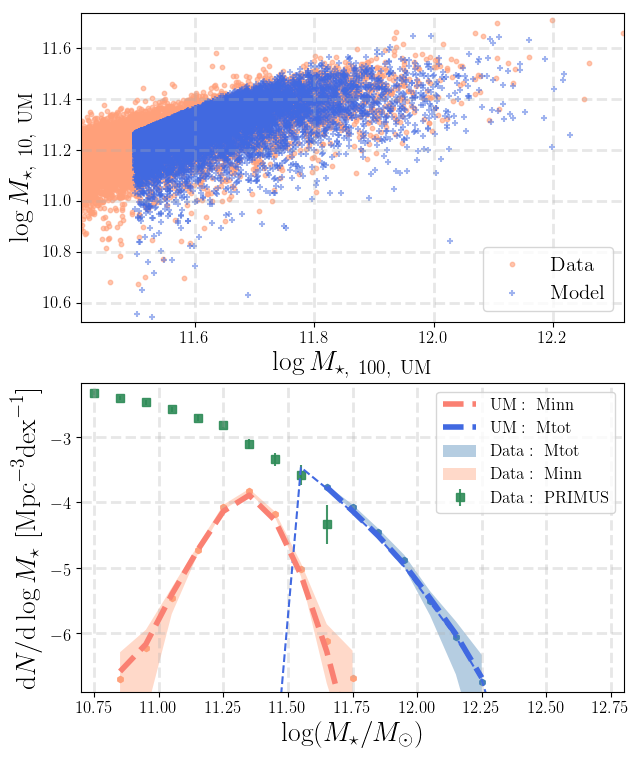

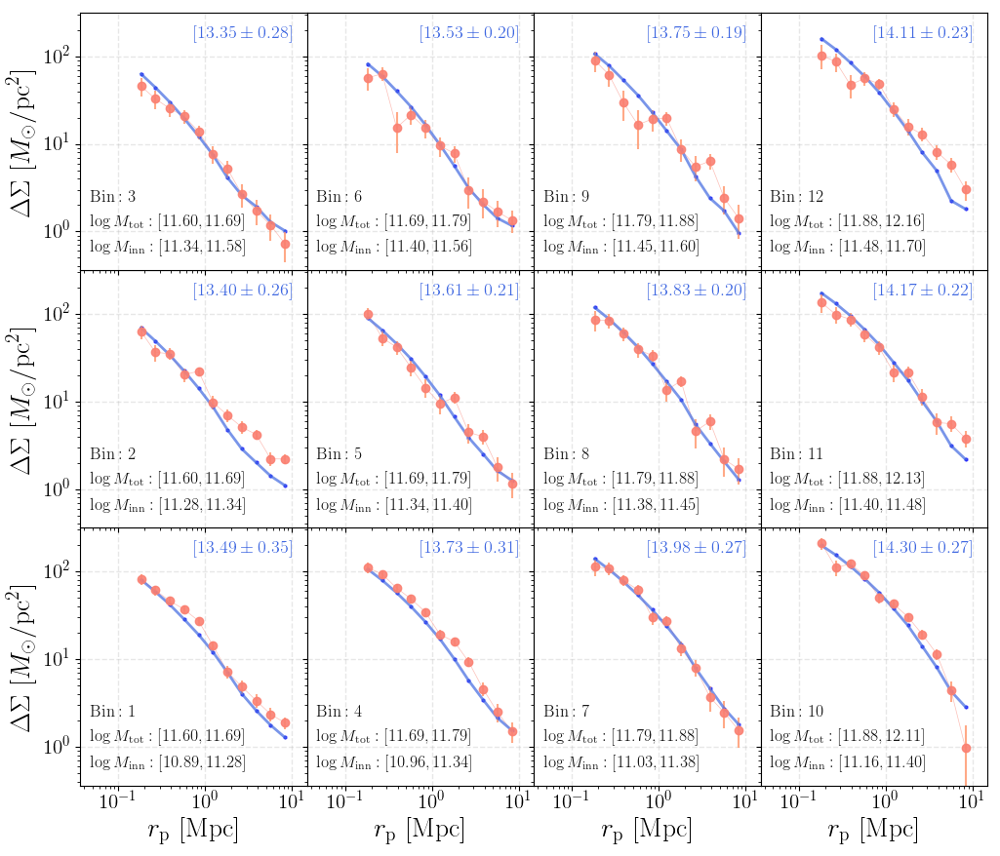

In [27]:
frac4f_model_prob = asap_predict_model_prob(frac4f_result_best, cfg, obs_data, um_data,  
                                            show_smf=True, show_dsigma=True, return_all=True)

um_smf_tot, um_smf_inn, um_dsigma, logms_mod_inn, logms_mod_tot, sig_logm, mask_tot = frac4f_model_prob

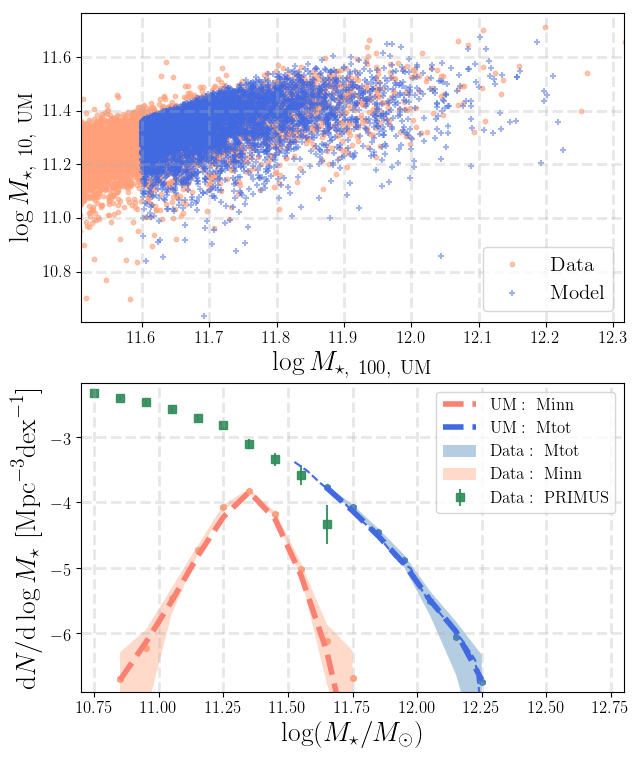

In [28]:
frac4f_model = asap_predict_model(frac4f_result_best, cfg, 
                                  obs_data, um_data, show_smf=True, return_all=True)

(um_smf_tot, um_smf_inn, um_dsigma, 
 logms_inn_mod_all, logms_tot_mod_all, 
 logms_halo_mod_all, mask_tot_all) = frac4f_model

#### Iso-halo mass trend

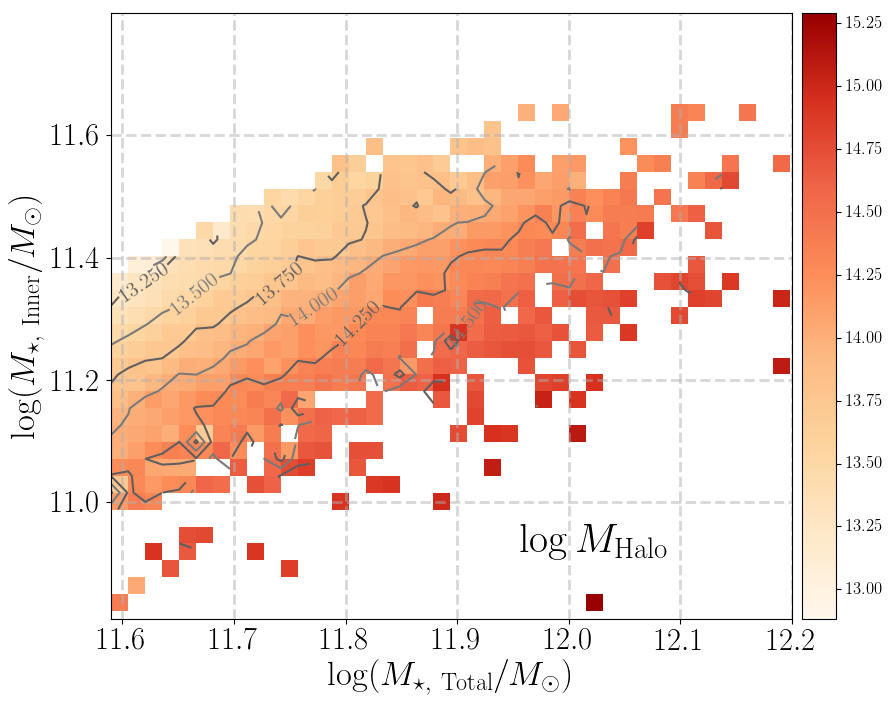

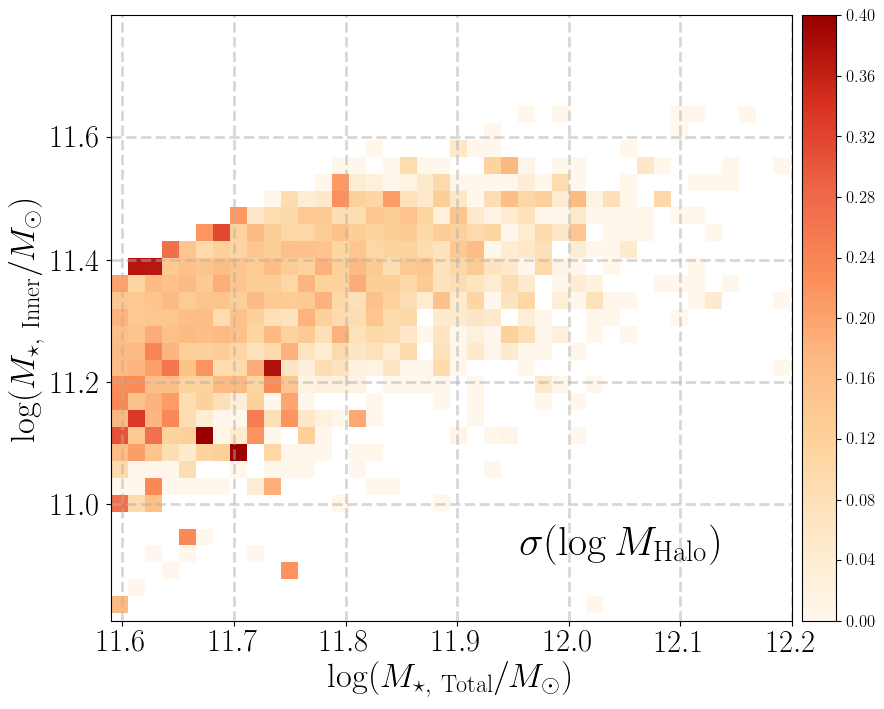

In [30]:
xx = logms_mod_tot
yy = logms_mod_inn
zz = um_mock['logmh_peak'][mask_tot]

# Median halo mass
fig = plot_mtot_minn_trend(xx, yy, zz, method=np.mean, 
                           x_lim=[11.59, 12.2], y_lim=[10.81, 11.799],
                           n_contour=9)

# Scatter
fig = plot_mtot_minn_trend(xx, yy, zz, method=np.nanstd, contour=False,
                           x_lim=[11.59, 12.2], y_lim=[10.81, 11.799], 
                           title=r'$\sigma(\log M_{\mathrm{Halo}})$',
                           z_max=0.4)

#### Satellite fraction

/Users/song/Dropbox/work/project/hsc_um2/asap/um_model_plot.py:834: RuntimeWarning: Mean of empty slice
  for k in range(len(logms_bin))]


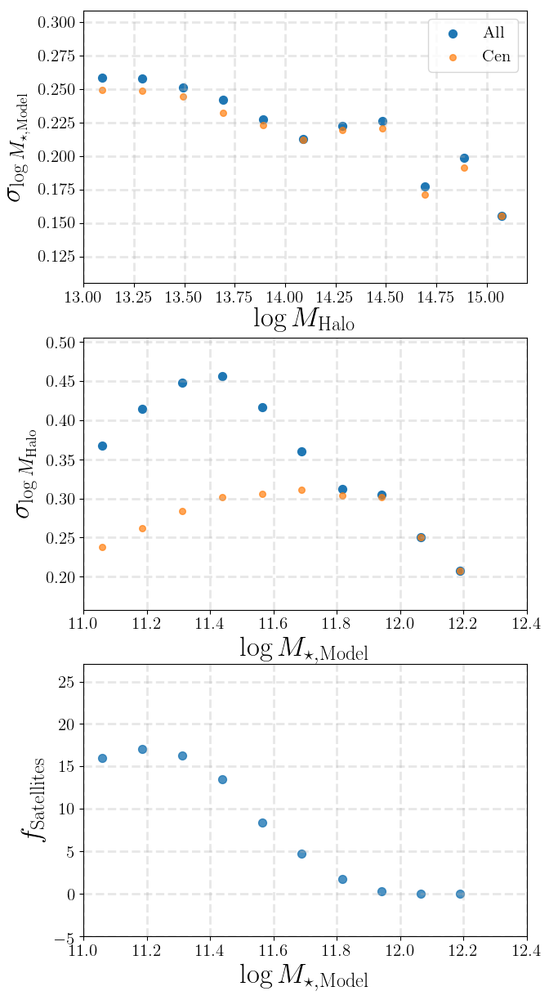

In [25]:
fig = plot_mass_scatter_fsat_trends(um_mock, logms_tot_mod_all, nbin=12)

### Result 7

* Greymalkin
* Using `logmh_peak`
* `de` Move 
* 256 Walkers; 600 burn-in; 300 runs

In [31]:
(frac4g_burnin_samples, 
 frac4g_burnin_chains, 
 frac4g_burnin_lnprob, 
 frac4g_burnin_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_12_burnin.npz')

(frac4g_result_samples, 
 frac4g_result_chains, 
 frac4g_result_lnprob, 
 frac4g_result_best, _, _) = mcmc_load_results(
    'test/asap_smdpl_mmax_m10_frac4_test_12_run.npz')

print(np.nanmax(frac4g_burnin_lnprob), frac4g_burnin_best)
print(np.nanmax(frac4g_result_lnprob), frac4g_result_best)

(-212.48843308380896, array([ 0.59142687,  3.82995646, -0.00982091,  0.05146568,  0.66202816,
       -0.08716298,  0.20241667]))
(-178.4406498421654, array([ 5.67482666e-01,  4.15937655e+00, -2.45444893e-03,  3.54513838e-02,
        6.81450888e-01, -1.81546350e-01,  6.89032545e-02]))


#### Corner plot

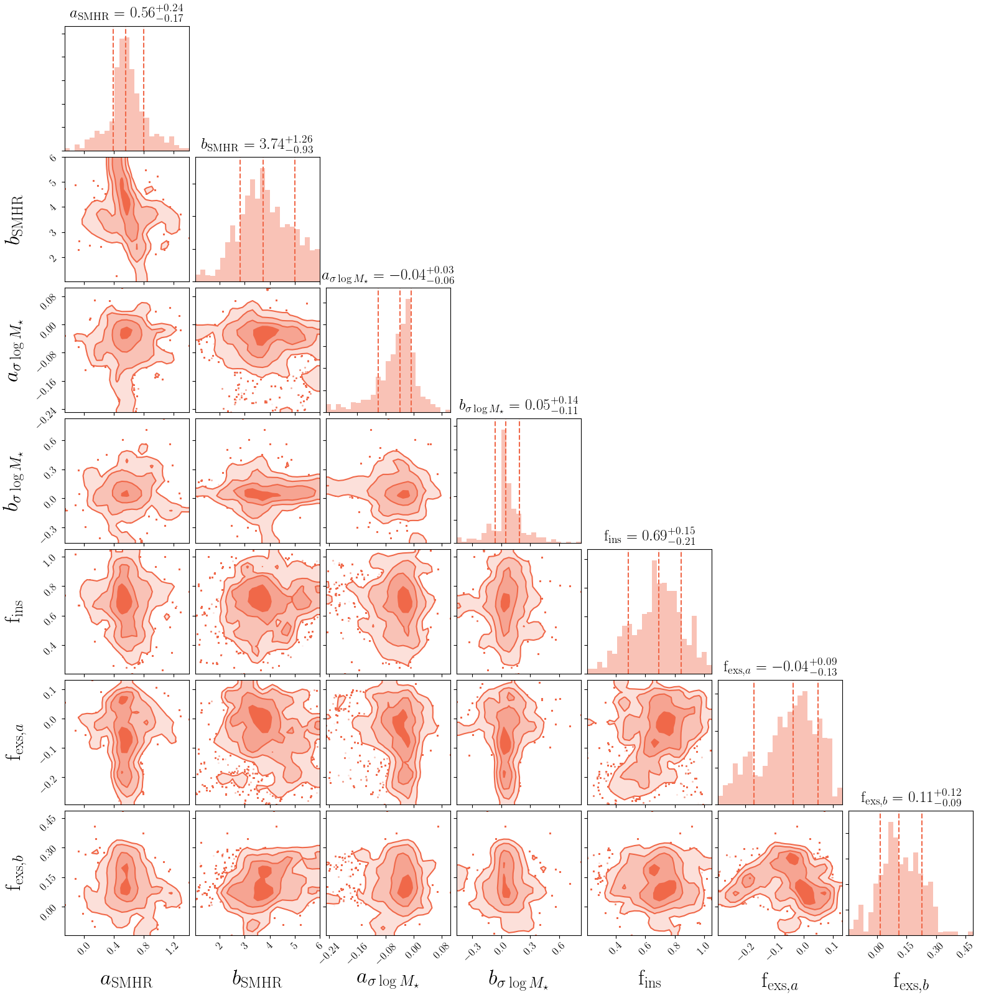

In [32]:
frac4g_corner = plot_mcmc_corner(frac4g_result_samples, cfg['mcmc_labels'])

#### Trace plot

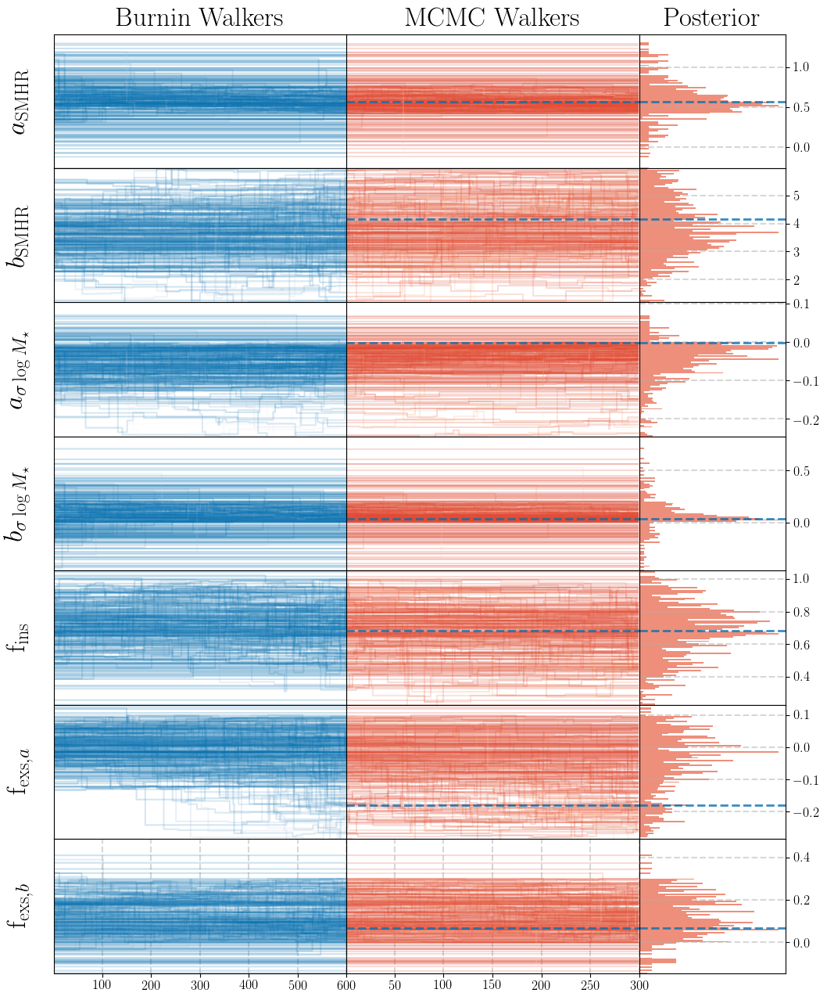

In [33]:
frac4g_trace = plot_mcmc_trace(frac4g_result_chains, 
                               cfg['mcmc_labels'],
                               mcmc_best=frac4g_result_best,
                               mcmc_burnin=frac4g_burnin_chains)

#### Best Model 

In [35]:
print(frac4g_result_best)

[ 5.67482666e-01  4.15937655e+00 -2.45444893e-03  3.54513838e-02
  6.81450888e-01 -1.81546350e-01  6.89032545e-02]


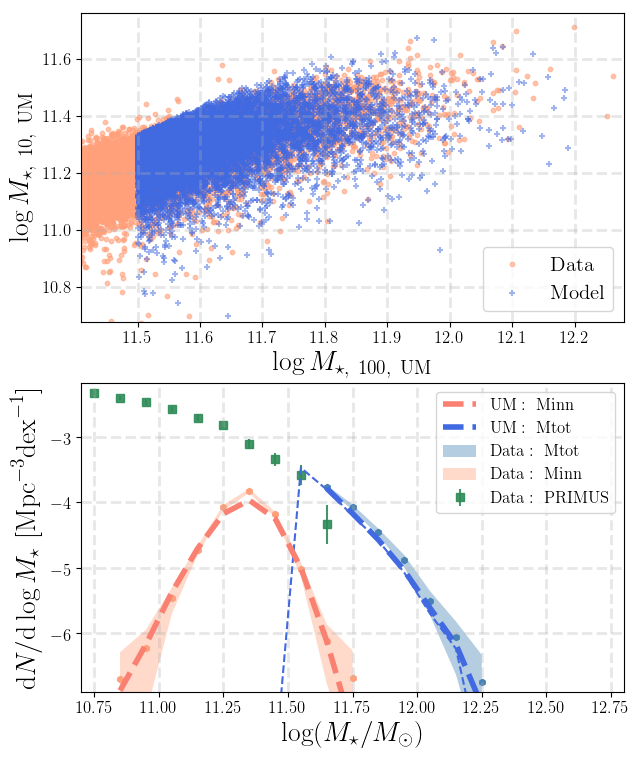

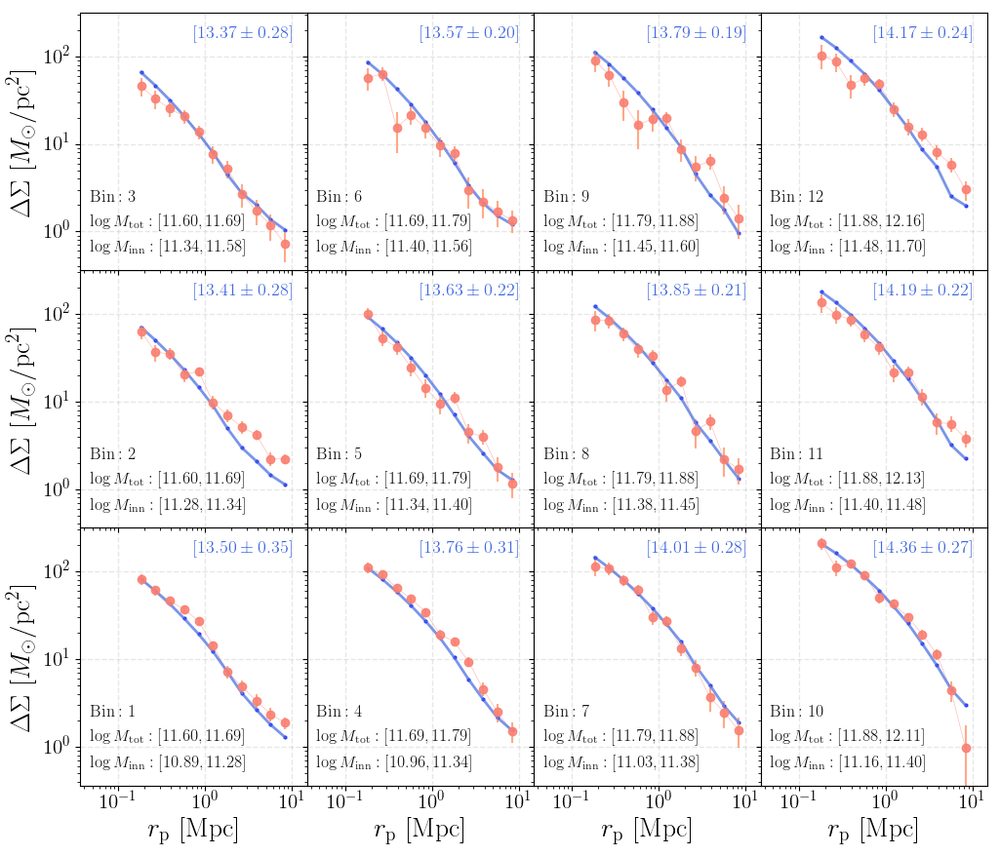

In [34]:
frac4g_model_prob = asap_predict_model_prob(frac4g_result_best, cfg, obs_data, um_data,  
                                            show_smf=True, show_dsigma=True, return_all=True)

um_smf_tot, um_smf_inn, um_dsigma, logms_mod_inn, logms_mod_tot, sig_logm, mask_tot = frac4g_model_prob